In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
!pip install shap==0.23.0

You should consider upgrading via the 'pip install --upgrade pip' command.


In [62]:
import shap

# Data Preparation

In [3]:
df = pd.read_excel('11008~11108_EAF_O2_data.xlsx')

In [4]:
df.columns

Index(['月份', '爐號', 'W1', 'W2', 'P2', 'P0', 'K3', 'K5', 'K8', 'K1', 'K0', 'C0',
       'C1', 'C2', 'D3', 'D4', 'S0', 'D8', 'D1', 'D0', 'D7', 'SCRAP\n廢鋼',
       '氧化鎂\nMgO', '瑩石\nCaF2', '石灰爐內', '焦炭', '石灰投料2累積吹氧量', '鐵水[SI]', '鐵水\n溫度',
       '出銑至鐵水倒入時間差', '爐代回數', '爐別', '生產模式', '[C]GK上限', '[P]GK上限', '第1次完整測-時間',
       '第1次完整測-溫度', '第1次完整測-累積送電量', '第1次完整測-累積吹氧量', '第1次完整測-累積NG量',
       '第1次完整測-累積碳粉量\n(造渣)', '第1次完整測-成分[C]', '第1次完整測-成分[P]', '第N次完整測-時間',
       '第N次完整測-溫度', '第N次完整測-累積送電量', '第N次完整測-累積吹氧量', '第N次完整測-累積NG量',
       '第N次完整測-累積碳粉量', '第N次完整測-成分[C]', '第N次完整測-成分[P]', '總O2', '電力\nkwh'],
      dtype='object')

In [5]:
df.columns = ['month', 'heatno', 'W1', 'W2', 'P2', 'P0', 'K3', 'K5', 'K8', 'K1', 'K0', 'C0', 'C1', 'C2', 'D3', 'D4', 'S0', 'D8', 'D1', 'D0', 'D7', 'scrap', 
              'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 'HM_Si', 'HM_temp', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat', 'one_twin_heat',
              'C_GK', 'P_GK', 'nth_time', 'nth_temp', 'nth_power', 'nth_O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'nth_P', 
              'n+_time', 'n+_temp', 'n+_power', 'n+_O2', 'n+_NG', 'n+_C_powder', 'n+_C', 'n+_P', 'total_O2', 'total_power']

In [6]:
df.head()

,month,heatno,W1,W2,P2,P0,K3,K5,K8,K1,...,n+_time,n+_temp,n+_power,n+_O2,n+_NG,n+_C_powder,n+_C,n+_P,total_O2,total_power
0,110-08月,VL558,NaN,93100.0,NaN,NaN,12200.0,NaN,NaN,NaN,...,2021-08-23 15:30:48.697,1613,25400,7638,838,1834,3.85,12,7954,25600
1,110-08月,XL559,89400.0,NaN,NaN,NaN,13600.0,NaN,NaN,NaN,...,2021-08-23 16:23:15.457,1587,29800,6302,741,1269,5.90,8,6894,31200
2,110-08月,VL562,92700.0,NaN,NaN,NaN,12200.0,NaN,NaN,NaN,...,2021-08-23 18:51:54.690,1629,25300,5686,744,467,4.78,10,5960,25300
3,110-08月,XL563,90400.0,NaN,NaN,NaN,13800.0,NaN,NaN,NaN,...,2021-08-23 21:30:16.633,1594,28300,6171,1190,1006,4.59,8,6907,31700
4,110-08月,VL564,90100.0,NaN,NaN,NaN,16500.0,NaN,NaN,NaN,...,2021-08-23 22:09:45.157,1619,28300,6544,807,1158,4.24,11,6899,28300


In [7]:
df_timeorder = pd.read_excel('timeorder_10041.xlsx')
df_timeorder.head()

,爐號,SEQ,第1次完整測-時間,第1次完整測-溫度,第1次完整測-累積送電量,第1次完整測-累積吹氧量,第1次完整測-累積NG量,第1次完整測-累積碳粉量(造渣),第1次完整測-成分[C],第1次完整測-成分[P],SEQ_2,第N次完整測-時間,第N次完整測-溫度,第N次完整測-累積送電量,第N次完整測-累積吹氧量,第N次完整測-累積NG量,第N次完整測-累積碳粉量,第N次完整測-成分[C],第N次完整測-成分[P]
0,VL387,1,2021-08-14 23:51:41,1580,15600,6417,772,1023,5.86,10,2,2021-08-14 23:54:57,1593,18400,6828,797,1324,6.06,10
1,VL553,1,2021-08-23 09:15:01,1640,19000,5777,615,224,5.76,7,3,2021-08-23 09:17:49,1570,22400,6170,640,491,5.53,8
2,VL558,1,2021-08-23 15:28:10,1576,22300,7353,817,1562,4.92,12,2,2021-08-23 15:30:48,1613,25400,7638,838,1834,3.85,12
3,VL562,1,2021-08-23 18:48:23,1578,21100,5234,714,249,9.47,9,2,2021-08-23 18:51:54,1629,25300,5686,744,467,4.78,10
4,VL568,1,2021-08-24 04:15:15,1581,19800,6251,1065,831,5.56,11,2,2021-08-24 04:18:02,1623,22900,6586,1097,1112,3.49,14


In [8]:
df_timeorder.columns

Index(['爐號', 'SEQ', '第1次完整測-時間', '第1次完整測-溫度', '第1次完整測-累積送電量', '第1次完整測-累積吹氧量',
       '第1次完整測-累積NG量', '第1次完整測-累積碳粉量(造渣)', '第1次完整測-成分[C]', '第1次完整測-成分[P]',
       'SEQ_2', '第N次完整測-時間', '第N次完整測-溫度', '第N次完整測-累積送電量', '第N次完整測-累積吹氧量',
       '第N次完整測-累積NG量', '第N次完整測-累積碳粉量', '第N次完整測-成分[C]', '第N次完整測-成分[P]'],
      dtype='object')

In [9]:
df_timeorder.rename(columns={'爐號': 'heatno'}, inplace=True)
df_timeorder.columns

Index(['heatno', 'SEQ', '第1次完整測-時間', '第1次完整測-溫度', '第1次完整測-累積送電量',
       '第1次完整測-累積吹氧量', '第1次完整測-累積NG量', '第1次完整測-累積碳粉量(造渣)', '第1次完整測-成分[C]',
       '第1次完整測-成分[P]', 'SEQ_2', '第N次完整測-時間', '第N次完整測-溫度', '第N次完整測-累積送電量',
       '第N次完整測-累積吹氧量', '第N次完整測-累積NG量', '第N次完整測-累積碳粉量', '第N次完整測-成分[C]',
       '第N次完整測-成分[P]'],
      dtype='object')

In [10]:
df = pd.merge(df,df_timeorder,how='inner',on='heatno')
df.columns

Index(['month', 'heatno', 'W1', 'W2', 'P2', 'P0', 'K3', 'K5', 'K8', 'K1', 'K0',
       'C0', 'C1', 'C2', 'D3', 'D4', 'S0', 'D8', 'D1', 'D0', 'D7', 'scrap',
       'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 'HM_Si', 'HM_temp',
       'HM_temp_rundown_time', 'heat_counts', 'AB_heat', 'one_twin_heat',
       'C_GK', 'P_GK', 'nth_time', 'nth_temp', 'nth_power', 'nth_O2', 'nth_NG',
       'nth_C_powder', 'nth_C', 'nth_P', 'n+_time', 'n+_temp', 'n+_power',
       'n+_O2', 'n+_NG', 'n+_C_powder', 'n+_C', 'n+_P', 'total_O2',
       'total_power', 'SEQ', '第1次完整測-時間', '第1次完整測-溫度', '第1次完整測-累積送電量',
       '第1次完整測-累積吹氧量', '第1次完整測-累積NG量', '第1次完整測-累積碳粉量(造渣)', '第1次完整測-成分[C]',
       '第1次完整測-成分[P]', 'SEQ_2', '第N次完整測-時間', '第N次完整測-溫度', '第N次完整測-累積送電量',
       '第N次完整測-累積吹氧量', '第N次完整測-累積NG量', '第N次完整測-累積碳粉量', '第N次完整測-成分[C]',
       '第N次完整測-成分[P]'],
      dtype='object')

In [11]:
df = df.drop(['nth_time', 'nth_temp', 'nth_power', 'nth_O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'nth_P', 
              'n+_time', 'n+_temp', 'n+_power','n+_O2', 'n+_NG', 'n+_C_powder', 'n+_C', 'n+_P', 'SEQ', 'SEQ_2'],axis=1)

In [12]:
df.rename(columns={'第1次完整測-時間':'nth_time', '第1次完整測-溫度':'nth_temp', '第1次完整測-累積送電量':'nth_power', '第1次完整測-累積吹氧量':'nth_O2',
                  '第1次完整測-累積NG量':'nth_NG', '第1次完整測-累積碳粉量(造渣)':'nth_C_powder', '第1次完整測-成分[C]':'nth_C', '第1次完整測-成分[P]':'nth_P',
                  '第N次完整測-時間':'n+_time', '第N次完整測-溫度':'n+_temp', '第N次完整測-累積送電量':'n+_power', '第N次完整測-累積吹氧量':'n+_O2',
                  '第N次完整測-累積NG量':'n+_NG', '第N次完整測-累積碳粉量':'n+_C_powder', '第N次完整測-成分[C]':'n+_C', '第N次完整測-成分[P]':'n+_P'}, inplace=True)
df.columns

Index(['month', 'heatno', 'W1', 'W2', 'P2', 'P0', 'K3', 'K5', 'K8', 'K1', 'K0',
       'C0', 'C1', 'C2', 'D3', 'D4', 'S0', 'D8', 'D1', 'D0', 'D7', 'scrap',
       'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 'HM_Si', 'HM_temp',
       'HM_temp_rundown_time', 'heat_counts', 'AB_heat', 'one_twin_heat',
       'C_GK', 'P_GK', 'total_O2', 'total_power', 'nth_time', 'nth_temp',
       'nth_power', 'nth_O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'nth_P',
       'n+_time', 'n+_temp', 'n+_power', 'n+_O2', 'n+_NG', 'n+_C_powder',
       'n+_C', 'n+_P'],
      dtype='object')

In [13]:
df.shape

(4928, 53)

In [14]:
df.isna().sum()

month                      0
heatno                     0
W1                      1471
W2                      3457
P2                      4924
P0                      4928
K3                      3550
K5                      3798
K8                      3948
K1                      4928
K0                      4194
C0                      4705
C1                      4058
C2                      4928
D3                      1596
D4                       500
S0                      1042
D8                      4659
D1                        49
D0                       443
D7                      4928
scrap                      0
MgO                        0
CaF2                     180
CaO                        0
coke                    2724
CaO_2_O2                   0
HM_Si                      0
HM_temp                    0
HM_temp_rundown_time       0
heat_counts                0
AB_heat                    0
one_twin_heat              0
C_GK                       0
P_GK          

In [15]:
df['W1'].fillna(value=0, inplace=True)
df['W2'].fillna(value=0, inplace=True)
df['P2'].fillna(value=0, inplace=True)
df['P0'].fillna(value=0, inplace=True)
df['K3'].fillna(value=0, inplace=True)
df['K5'].fillna(value=0, inplace=True)
df['K8'].fillna(value=0, inplace=True)
df['K1'].fillna(value=0, inplace=True)
df['K0'].fillna(value=0, inplace=True)
df['C0'].fillna(value=0, inplace=True)
df['C1'].fillna(value=0, inplace=True)
df['C2'].fillna(value=0, inplace=True)
df['D3'].fillna(value=0, inplace=True)
df['D4'].fillna(value=0, inplace=True)
df['S0'].fillna(value=0, inplace=True)
df['D8'].fillna(value=0, inplace=True)
df['D1'].fillna(value=0, inplace=True)
df['D0'].fillna(value=0, inplace=True)
df['D7'].fillna(value=0, inplace=True)
df = df[~df['HM_temp_rundown_time'].isna()]
df['MgO'].fillna(value=0, inplace=True)
df['CaF2'].fillna(value=0, inplace=True)
df['CaO'].fillna(value=0, inplace=True)
df['coke'].fillna(value=0, inplace=True)
df = df[~df['CaO_2_O2'].isna()]
df = df[df['HM_Si'] > 0]
df = df[~df['heat_counts'].isna()]
df = df[~df['one_twin_heat'].isna()]

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4928 entries, 0 to 4927
Data columns (total 53 columns):
month                   4928 non-null object
heatno                  4928 non-null object
W1                      4928 non-null float64
W2                      4928 non-null float64
P2                      4928 non-null float64
P0                      4928 non-null float64
K3                      4928 non-null float64
K5                      4928 non-null float64
K8                      4928 non-null float64
K1                      4928 non-null float64
K0                      4928 non-null float64
C0                      4928 non-null float64
C1                      4928 non-null float64
C2                      4928 non-null float64
D3                      4928 non-null float64
D4                      4928 non-null float64
S0                      4928 non-null float64
D8                      4928 non-null float64
D1                      4928 non-null float64
D0                   

In [17]:
df[['month', 'heatno', 'W1', 'W2', 'P2', 'P0', 'K3', 'K5', 'K8', 'K1', 'K0', 'C0',
       'C1', 'C2', 'D3', 'D4', 'S0', 'D8', 'D1', 'D0', 'D7']].head()

,month,heatno,W1,W2,P2,P0,K3,K5,K8,K1,...,C0,C1,C2,D3,D4,S0,D8,D1,D0,D7
0,110-08月,VL558,0.0,93100.0,0.0,0.0,12200.0,0.0,0.0,0.0,...,0.0,0.0,0.0,12500.0,12500.0,17000.0,5000.0,10400.0,10700.0,0.0
1,110-08月,XL559,89400.0,0.0,0.0,0.0,13600.0,0.0,0.0,0.0,...,0.0,0.0,0.0,10800.0,10900.0,18300.0,5000.0,10900.0,11900.0,0.0
2,110-08月,VL562,92700.0,0.0,0.0,0.0,12200.0,0.0,0.0,0.0,...,0.0,0.0,0.0,12500.0,13100.0,6600.0,5000.0,10500.0,11600.0,0.0
3,110-08月,XL563,90400.0,0.0,0.0,0.0,13800.0,0.0,0.0,0.0,...,0.0,0.0,0.0,24500.0,10500.0,0.0,5000.0,14600.0,13300.0,0.0
4,110-08月,VL564,90100.0,0.0,0.0,0.0,16500.0,0.0,0.0,0.0,...,0.0,0.0,0.0,23800.0,2200.0,0.0,5000.0,6600.0,18900.0,0.0


In [18]:
df['G1'] = df['W1']+df['W2']
df['G2'] = df['P2']+df['P0']
df['G3'] = df['K3']+df['K5']+df['K8']+df['K1']+df['K0']
df['G4'] = df['C0']+df['C1']+df['C2']+df['D3']
df['G5'] = df['D4']+df['S0']+df['D8']
df['G6'] = df['D1']+df['D0']+df['D7']

In [19]:
df.drop(['W1', 'W2', 'P2', 'P0', 'K3', 'K5', 'K8', 'K1', 'K0',
       'C0', 'C1', 'C2', 'D3', 'D4', 'S0', 'D8', 'D1', 'D0', 'D7'], axis=1, inplace=True)

In [20]:
df['AB_heat'] = df['AB_heat'].apply(lambda x: x[0])

In [21]:
df['AB_heat'].value_counts()

A    2523
B    2405
Name: AB_heat, dtype: int64

In [22]:
df['AB_heat'] = df['AB_heat'].map({'A':0, 'B':1})

In [23]:
df['one_twin_heat'].value_counts()

雙爐生產    3360
單爐生產    1568
Name: one_twin_heat, dtype: int64

In [24]:
df['one_twin_heat'] = df['one_twin_heat'].map({'雙爐生產':2, '單爐生產':1})

In [25]:
# df['is_cold_heat'].value_counts()

In [26]:
# df['is_cold_heat'] = df['is_cold_heat'].map({'冷爐':1, '冷啟爐新製程':2})
# df['is_cold_heat'].fillna(value=0, inplace=True)

In [27]:
df = df[df['HM_temp'] != '-']
df['HM_temp'] = df['HM_temp'].astype('int')

/opt/anaconda3/lib/python3.6/site-packages/pandas/core/ops.py:1649: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4928 entries, 0 to 4927
Data columns (total 40 columns):
month                   4928 non-null object
heatno                  4928 non-null object
scrap                   4928 non-null float64
MgO                     4928 non-null int64
CaF2                    4928 non-null float64
CaO                     4928 non-null int64
coke                    4928 non-null float64
CaO_2_O2                4928 non-null int64
HM_Si                   4928 non-null int64
HM_temp                 4928 non-null int64
HM_temp_rundown_time    4928 non-null int64
heat_counts             4928 non-null int64
AB_heat                 4928 non-null int64
one_twin_heat           4928 non-null int64
C_GK                    4928 non-null float64
P_GK                    4928 non-null int64
total_O2                4928 non-null int64
total_power             4928 non-null int64
nth_time                4928 non-null datetime64[ns]
nth_temp                4928 non-null 

In [29]:
df = df[(df['n+_C']>=5) & (df['n+_C']<=30)]
df = df[(df['nth_temp']>1400) & (df['nth_temp']<1650)]
df = df[(df['nth_power']>1500) & (df['nth_power']<70000)]
df = df[(df['nth_O2']>3000) & (df['nth_O2']<10000)]
df = df[df['total_O2']>3000]
df = df[(df['nth_NG']>300) & (df['nth_NG']<3000)]
# df = df[(df['nth_C_powder']>300) & (df['nth_C_powder']<3000)]
df = df[df['nth_temp'] < df['n+_temp']]
df = df[df['nth_power'] < df['n+_power']]
df = df[df['nth_O2'] < df['n+_O2']]
df = df[df['nth_NG'] < df['n+_NG']]
df = df[df['nth_C_powder'] < df['n+_C_powder']]
df = df[(df['G1']>=30000) & (df['G1']<=110000)]
df = df[df['G3']<=30000]
df = df[df['scrap']>=0]
df = df[df['MgO']<=3000]
df = df[df['CaF2']<=500]
df = df[(df['CaO']>=3000) & (df['CaO']<=11000)]
df = df[df['coke']<=3000]
df = df[(df['HM_temp']>=1300) & (df['HM_temp']<=1650)]
df = df[df['n+_temp']<=1700]
df.shape

(2160, 40)

In [30]:
df = df[df['n+_P'] - df['nth_P'] <=3]
df.shape

(1912, 40)

/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


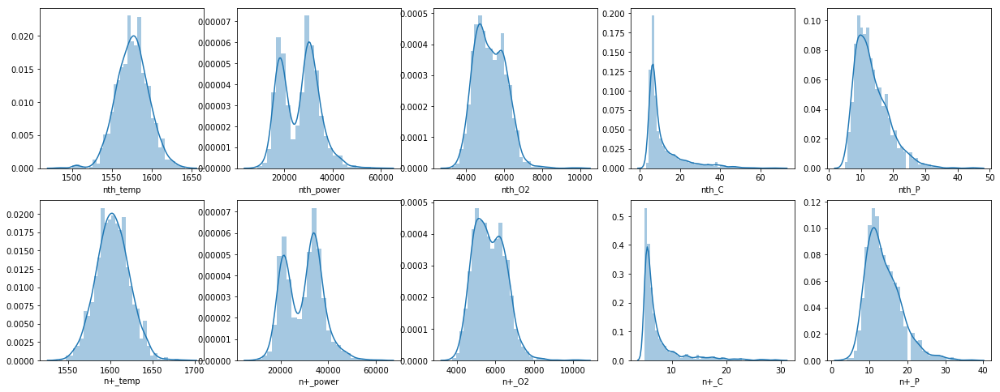

In [29]:
plt.figure(figsize=(21, 8))
plt.subplot(2,5,1)
sns.distplot(df['nth_temp'])
plt.subplot(2,5,2)
sns.distplot(df['nth_power'])
plt.subplot(2,5,3)
sns.distplot(df['nth_O2'])
plt.subplot(2,5,4)
sns.distplot(df['nth_C'])
plt.subplot(2,5,5)
sns.distplot(df['nth_P'])
plt.subplot(2,5,6)
sns.distplot(df['n+_temp'])
plt.subplot(2,5,7)
sns.distplot(df['n+_power'])
plt.subplot(2,5,8)
sns.distplot(df['n+_O2'])
plt.subplot(2,5,9)
sns.distplot(df['n+_C'])
plt.subplot(2,5,10)
sns.distplot(df['n+_P'])

In [31]:
df['time_diff'] = df['n+_time'] - df['nth_time']
df['time_diff'] = df['time_diff'].astype('timedelta64[s]')
df = df[df['time_diff']>0]

In [32]:
df['collapse'] = df['nth_temp'] > df['n+_temp']
df['collapse'] = df['collapse'].apply(lambda x: 1 if x == True else 0)
df['power_diff'] = df['n+_power'] - df['nth_power']
df['power_rise_rate'] = df['power_diff']/df['time_diff']
df['O2_diff'] = df['n+_O2'] - df['nth_O2']
df['O2_rise_rate'] = df['O2_diff']/df['time_diff']
df['nth_power/O2'] = df['nth_power'] / df['nth_O2']
df['n+_power/O2'] = df['n+_power'] / df['n+_O2']

In [33]:
df['check_1'] = (df['nth_C'] < df['C_GK'] - 5) 
df['check_2'] = (df['nth_P'] < df['P_GK'] - 7)
df['check_3'] = df['nth_temp'] < 1615
df['check_1'] = df['check_1'].astype('str')
df['check_2'] = df['check_2'].astype('str')
df['check_3'] = df['check_3'].astype('str')
df['check'] = df['check_1'] + '_' + df['check_2'] + '_' + df['check_3']
df['check'] = df['check'].map({'True_True_True':'case1', 'False_False_True':'case2', 'False_True_True':'case3', 'True_False_True':'case4', 
                              'True_True_False':'case5', 'False_False_False':'case6', 'False_True_False':'case7', 'True_False_False':'case8'})
df = df.drop(['check_1','check_2','check_3'],axis=1)

In [34]:
df = df.join(pd.get_dummies(df['check']))
df = df.drop(['check'],axis=1)

In [35]:
df.columns

Index(['month', 'heatno', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2',
       'HM_Si', 'HM_temp', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat',
       'one_twin_heat', 'C_GK', 'P_GK', 'total_O2', 'total_power', 'nth_time',
       'nth_temp', 'nth_power', 'nth_O2', 'nth_NG', 'nth_C_powder', 'nth_C',
       'nth_P', 'n+_time', 'n+_temp', 'n+_power', 'n+_O2', 'n+_NG',
       'n+_C_powder', 'n+_C', 'n+_P', 'G1', 'G2', 'G3', 'G4', 'G5', 'G6',
       'time_diff', 'collapse', 'power_diff', 'power_rise_rate', 'O2_diff',
       'O2_rise_rate', 'nth_power/O2', 'n+_power/O2', 'case1', 'case2',
       'case3', 'case4', 'case5', 'case6', 'case7', 'case8'],
      dtype='object')

In [36]:
# df_normal = df[df['collapse'] == 0]
# df_collapse = df[df['collapse'] == 1]
# df_normal.shape, df_collapse.shape

In [37]:
# wanted_list_O2_power = ['month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat', 'one_twin_heat', 'is_cold_heat', 'C_GK', 'P_GK', 
#                         'G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 
#                         'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG', 'nth_C_powder', 'nth_C',  'total_O2', 'total_power']

wanted_list_O2_power = ['month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK', 'P_GK', 
                        'G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 
                        'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG', 'nth_C_powder', 'nth_C', 
                        'n+_C', 'n+_temp', 'n+_power', 'n+_O2']

wanted_list_C_P_temp = ['month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK', 'P_GK', 
                        'G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 'case1', 'case2', 'case3', 'case4', 'case5', 'case6', 'case7', 'case8',
                        'time_diff', 'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'nth_P', 'n+_power', 'power_diff', 'power_rise_rate', 
                        'n+_O2', 'O2_diff', 'O2_rise_rate', 'n+_power/O2', 'n+_NG', 'n+_C_powder', 'n+_C', 'n+_P', 'n+_temp']

In [38]:
df_O2_power = df[wanted_list_O2_power]
df_C_P_temp = df[wanted_list_C_P_temp]

In [39]:
info_list = ['month', 'heatno']

In [40]:
df_O2_power['month'].value_counts().sort_index()

110-08月     37
110-09月    139
110-10月    198
110-11月    159
110-12月    218
111-01     158
111-02     136
111-03     237
111-04     191
111-05     185
111-06     136
111-07      70
111-08      48
Name: month, dtype: int64

In [41]:
df_O2_power_test = df_O2_power[df_O2_power['month'].isin(['111-05', '111-06', '111-07', '111-08'])]
df_O2_power_train_valid = df_O2_power[~df_O2_power['month'].isin(['111-05', '111-06', '111-07', '111-08'])]
df_C_P_temp_test = df_C_P_temp[df_C_P_temp['month'].isin(['111-05', '111-06', '111-07', '111-08'])]
df_C_P_temp_train_valid = df_C_P_temp[~df_C_P_temp['month'].isin(['111-05', '111-06', '111-07', '111-08'])]
df_O2_power_test.shape, df_O2_power_train_valid.shape, df_C_P_temp_test.shape, df_C_P_temp_train_valid.shape

((439, 33), (1473, 33), (439, 51), (1473, 51))

In [40]:
df_C_P_temp_test.head()

,month,heatno,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,...,power_rise_rate,n+_O2,O2_diff,O2_rise_rate,n+_power/O2,n+_NG,n+_C_powder,n+_C,n+_P,n+_temp
3741,111-05,VQ824,1498,312,123,979,0,2,14.0,25,...,14.285714,6179,204,1.457143,5.502508,937,783,6.39,7,1596
3742,111-05,XQ825,1521,477,95,140,1,2,14.0,25,...,6.113537,4610,528,2.305677,7.114967,834,594,26.76,26,1603
3745,111-05,VQ828,1491,347,123,981,0,2,14.0,25,...,7.391304,5217,566,2.460870,5.999617,643,1004,27.16,18,1554
3746,111-05,VQ828,1491,347,123,981,0,2,14.0,25,...,1.746725,5780,563,2.458515,5.484429,672,1183,8.29,12,1590
3752,111-05,XQ832,1480,326,132,144,1,2,21.0,25,...,15.822785,6046,320,2.025316,5.838571,736,1366,5.17,20,1603


In [41]:
df_C_P_temp_train_valid.head()

,month,heatno,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,...,power_rise_rate,n+_O2,O2_diff,O2_rise_rate,n+_power/O2,n+_NG,n+_C_powder,n+_C,n+_P,n+_temp
1,110-08月,XL559,1488,286,147,263,1,2,17.0,20,...,16.822430,6302,122,1.140187,4.728658,741,1269,5.90,8,1587
8,110-08月,VL570,1448,114,17,418,0,2,23.0,25,...,19.277108,5727,336,2.024096,3.457307,753,736,8.39,10,1608
11,110-08月,VL575,1482,264,94,422,0,2,21.0,25,...,16.058394,6317,313,2.284672,3.387684,958,1127,12.52,20,1621
15,110-08月,VL579,1484,132,196,424,0,2,21.0,25,...,16.326531,6065,484,1.975510,3.577906,660,1150,5.30,11,1613
16,110-08月,VL580,1468,259,55,425,0,1,21.0,25,...,16.167665,6391,357,2.137725,3.176342,781,884,6.20,18,1612


# Exploratory Data Analysis

In [42]:
df_C_P_temp_train_valid.columns

Index(['month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time',
       'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK', 'P_GK', 'G1', 'G2',
       'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke',
       'CaO_2_O2', 'case1', 'case2', 'case3', 'case4', 'case5', 'case6',
       'case7', 'case8', 'time_diff', 'nth_temp', 'nth_power', 'nth_O2',
       'nth_power/O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'nth_P', 'n+_power',
       'power_diff', 'power_rise_rate', 'n+_O2', 'O2_diff', 'O2_rise_rate',
       'n+_power/O2', 'n+_NG', 'n+_C_powder', 'n+_C', 'n+_P', 'n+_temp'],
      dtype='object')

In [42]:
df_O2_power_test = df_O2_power_test.drop(info_list, axis=1)
df_O2_power_train_valid = df_O2_power_train_valid.drop(info_list, axis=1)
df_C_P_temp_test = df_C_P_temp_test.drop(info_list, axis=1)
df_C_P_temp_train_valid = df_C_P_temp_train_valid.drop(info_list, axis=1)
df_O2_power_test.shape, df_O2_power_train_valid.shape, df_C_P_temp_test.shape, df_C_P_temp_train_valid.shape

((439, 31), (1473, 31), (439, 49), (1473, 49))

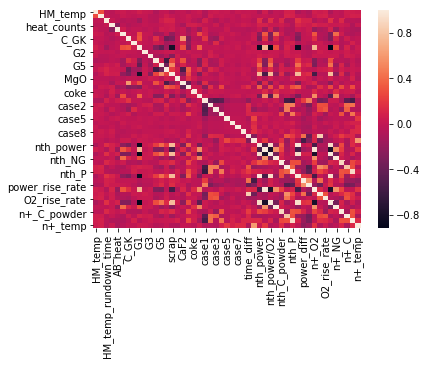

In [44]:
sns.heatmap(df_C_P_temp_train_valid.corr())

In [45]:
df_C_P_temp_train_valid.corr()

,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,G2,...,power_rise_rate,n+_O2,O2_diff,O2_rise_rate,n+_power/O2,n+_NG,n+_C_powder,n+_C,n+_P,n+_temp
HM_temp,1.000000,0.277215,-0.013553,-0.035114,0.016713,0.039670,0.002500,0.017332,0.068245,0.022418,...,-0.075966,0.072061,0.050129,0.070492,-0.093812,-0.007133,-0.016140,0.058882,0.059430,0.051368
HM_Si,0.277215,1.000000,-0.004187,-0.029512,-0.020932,0.026016,0.002188,-0.013976,0.007258,0.008863,...,-0.058089,0.037167,0.076425,0.090019,-0.019455,-0.001107,-0.030239,0.057987,0.086187,0.074130
HM_temp_rundown_time,-0.013553,-0.004187,1.000000,0.020667,-0.034612,-0.054236,-0.035046,-0.048621,-0.146315,0.003641,...,0.090945,-0.075411,-0.005131,-0.038450,0.170155,-0.013303,0.131975,-0.050050,-0.035717,-0.049085
heat_counts,-0.035114,-0.029512,0.020667,1.000000,-0.248526,-0.016428,-0.072206,-0.035062,-0.025574,0.013779,...,0.045622,0.104483,0.064980,0.071871,0.036149,0.029614,0.045156,0.014225,-0.078972,0.035604
AB_heat,0.016713,-0.020932,-0.034612,-0.248526,1.000000,0.054390,-0.025649,0.004339,0.004668,-0.028730,...,0.050341,-0.184138,-0.105273,-0.075216,0.093800,-0.177366,-0.000002,-0.048959,-0.086748,-0.100404
one_twin_heat,0.039670,0.026016,-0.054236,-0.016428,0.054390,1.000000,0.035894,-0.012470,0.284397,0.018402,...,0.021713,0.317111,-0.059523,-0.080938,-0.280378,0.404109,0.054783,-0.076940,-0.088975,-0.051596
C_GK,0.002500,0.002188,-0.035046,-0.072206,-0.025649,0.035894,1.000000,0.023278,0.319600,0.010766,...,0.012741,0.161485,-0.065420,-0.107380,-0.277334,0.117200,-0.068693,0.058151,-0.029746,0.005131
P_GK,0.017332,-0.013976,-0.048621,-0.035062,0.004339,-0.012470,0.023278,1.000000,0.064461,0.003391,...,-0.036269,0.027327,0.040184,-0.016883,-0.064367,0.032582,-0.061591,-0.026174,0.082929,-0.003820
G1,0.068245,0.007258,-0.146315,-0.025574,0.004668,0.284397,0.319600,0.064461,1.000000,-0.017569,...,-0.098964,0.731446,0.025154,0.025647,-0.908401,0.276741,-0.081036,0.096341,-0.052386,0.048889
G2,0.022418,0.008863,0.003641,0.013779,-0.028730,0.018402,0.010766,0.003391,-0.017569,1.000000,...,-0.052130,0.002161,0.062428,0.031181,0.013020,0.032668,0.009314,0.056960,0.012193,0.030130


In [46]:
abs(df_O2_power_train_valid.corr()['n+_O2']).sort_values(ascending = False)

n+_O2                   1.000000
nth_O2                  0.970102
nth_power/O2            0.773876
G1                      0.731446
scrap                   0.561490
nth_NG                  0.561023
n+_power                0.551826
nth_power               0.551409
CaO_2_O2                0.550117
one_twin_heat           0.317111
G5                      0.309368
G4                      0.291335
nth_C_powder            0.228114
AB_heat                 0.184138
n+_temp                 0.178100
C_GK                    0.161485
coke                    0.129273
CaF2                    0.112222
nth_temp                0.106463
heat_counts             0.104483
MgO                     0.083975
HM_temp_rundown_time    0.075411
HM_temp                 0.072061
CaO                     0.066062
G3                      0.039966
HM_Si                   0.037167
G6                      0.028653
nth_C                   0.028172
P_GK                    0.027327
n+_C                    0.013657
G2        

In [47]:
abs(df_O2_power_train_valid.corr()['n+_power']).sort_values(ascending = False)

n+_power                1.000000
nth_power               0.980528
nth_power/O2            0.932256
G1                      0.855281
scrap                   0.766702
nth_O2                  0.554099
n+_O2                   0.551826
G5                      0.418378
CaO                     0.363461
CaO_2_O2                0.321499
C_GK                    0.303505
CaF2                    0.292186
nth_C_powder            0.289209
one_twin_heat           0.226099
G4                      0.223143
G6                      0.208699
nth_NG                  0.200078
HM_temp_rundown_time    0.177369
nth_C                   0.167769
n+_C                    0.150632
heat_counts             0.104474
HM_temp                 0.096336
P_GK                    0.077259
nth_temp                0.072081
G3                      0.063487
MgO                     0.055125
AB_heat                 0.031534
G2                      0.024030
n+_temp                 0.010153
coke                    0.006647
HM_Si     

In [48]:
abs(df_C_P_temp_train_valid.corr()['n+_C']).sort_values(ascending = False)

n+_C                    1.000000
nth_C                   0.799194
case1                   0.456691
case2                   0.412214
case3                   0.357103
power_rise_rate         0.348174
O2_rise_rate            0.299727
nth_P                   0.287110
n+_P                    0.285725
O2_diff                 0.262339
power_diff              0.189137
n+_power                0.150632
scrap                   0.146635
G5                      0.127192
n+_C_powder             0.126958
time_diff               0.125753
nth_C_powder            0.120465
nth_power               0.115670
n+_temp                 0.110584
n+_power/O2             0.102145
case4                   0.097687
G1                      0.096341
nth_temp                0.093285
nth_O2                  0.077789
one_twin_heat           0.076940
G4                      0.074485
G3                      0.068814
HM_temp                 0.058882
C_GK                    0.058151
case6                   0.058077
HM_Si     

In [49]:
abs(df_C_P_temp_train_valid.corr()['n+_P']).sort_values(ascending = False)

n+_P                    1.000000
nth_P                   0.917389
case1                   0.556945
case4                   0.437454
case2                   0.428872
power_rise_rate         0.322055
n+_C_powder             0.293651
n+_C                    0.285725
nth_C                   0.283997
CaO                     0.279815
nth_C_powder            0.265680
power_diff              0.175738
O2_diff                 0.162344
nth_power               0.140392
n+_temp                 0.140111
O2_rise_rate            0.136576
nth_temp                0.132944
CaO_2_O2                0.125420
time_diff               0.123904
case8                   0.121179
nth_NG                  0.115603
n+_NG                   0.108005
nth_power/O2            0.107673
n+_power                0.103233
case6                   0.090931
MgO                     0.089592
one_twin_heat           0.088975
AB_heat                 0.086748
HM_Si                   0.086187
P_GK                    0.082929
heat_count

In [50]:
abs(df_C_P_temp_train_valid.corr()['n+_temp']).sort_values(ascending = False)

n+_temp                 1.000000
nth_temp                0.605504
power_diff              0.226230
nth_O2                  0.198092
case5                   0.196532
n+_O2                   0.178100
power_rise_rate         0.155963
nth_C_powder            0.144639
n+_P                    0.140111
case8                   0.139089
case7                   0.138845
n+_C                    0.110584
n+_C_powder             0.102884
AB_heat                 0.100404
case6                   0.094827
n+_power/O2             0.087486
MgO                     0.086870
nth_P                   0.085061
O2_diff                 0.082067
time_diff               0.081602
case4                   0.076676
HM_Si                   0.074130
case1                   0.072308
scrap                   0.065039
case3                   0.063845
nth_power/O2            0.062314
nth_C                   0.055468
G4                      0.054547
CaO_2_O2                0.052139
one_twin_heat           0.051596
HM_temp   

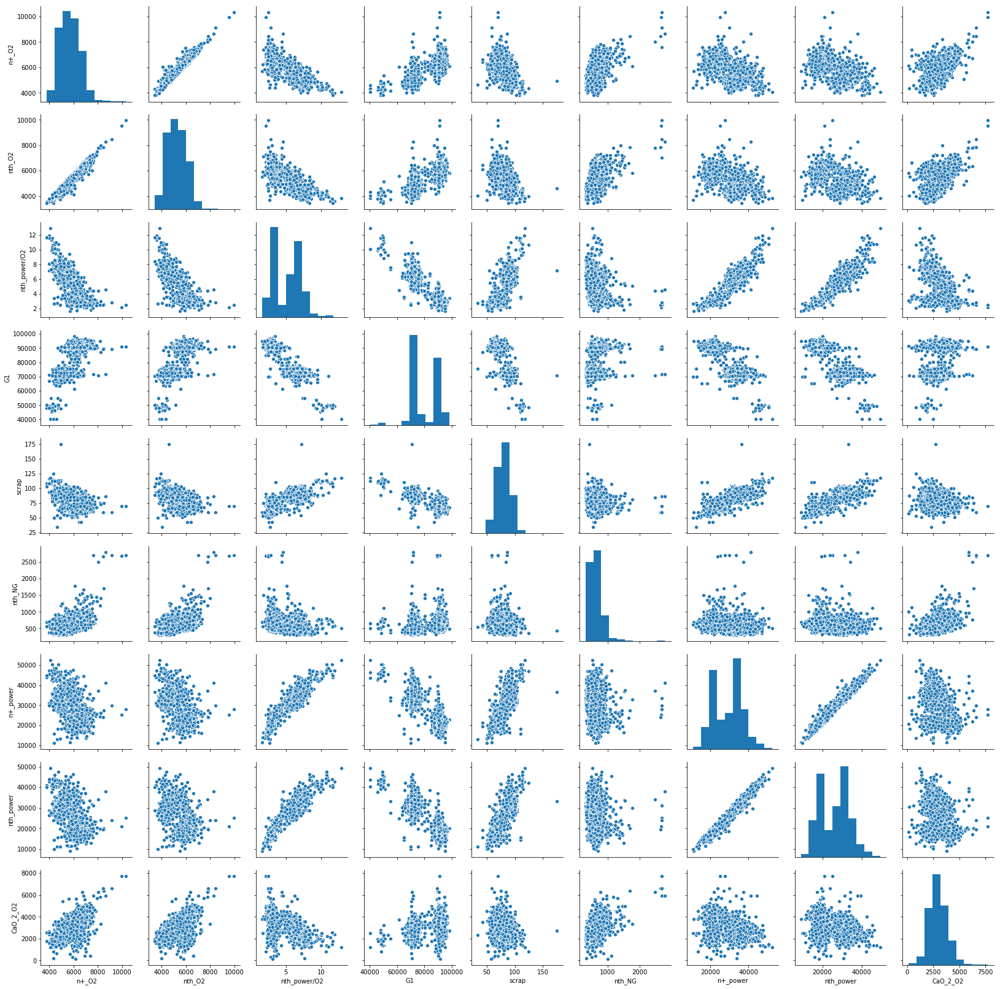

In [51]:
sns.pairplot(df_O2_power_train_valid[['n+_O2', 'nth_O2', 'nth_power/O2', 'G1', 'scrap', 'nth_NG', 'n+_power', 'nth_power', 'CaO_2_O2']])

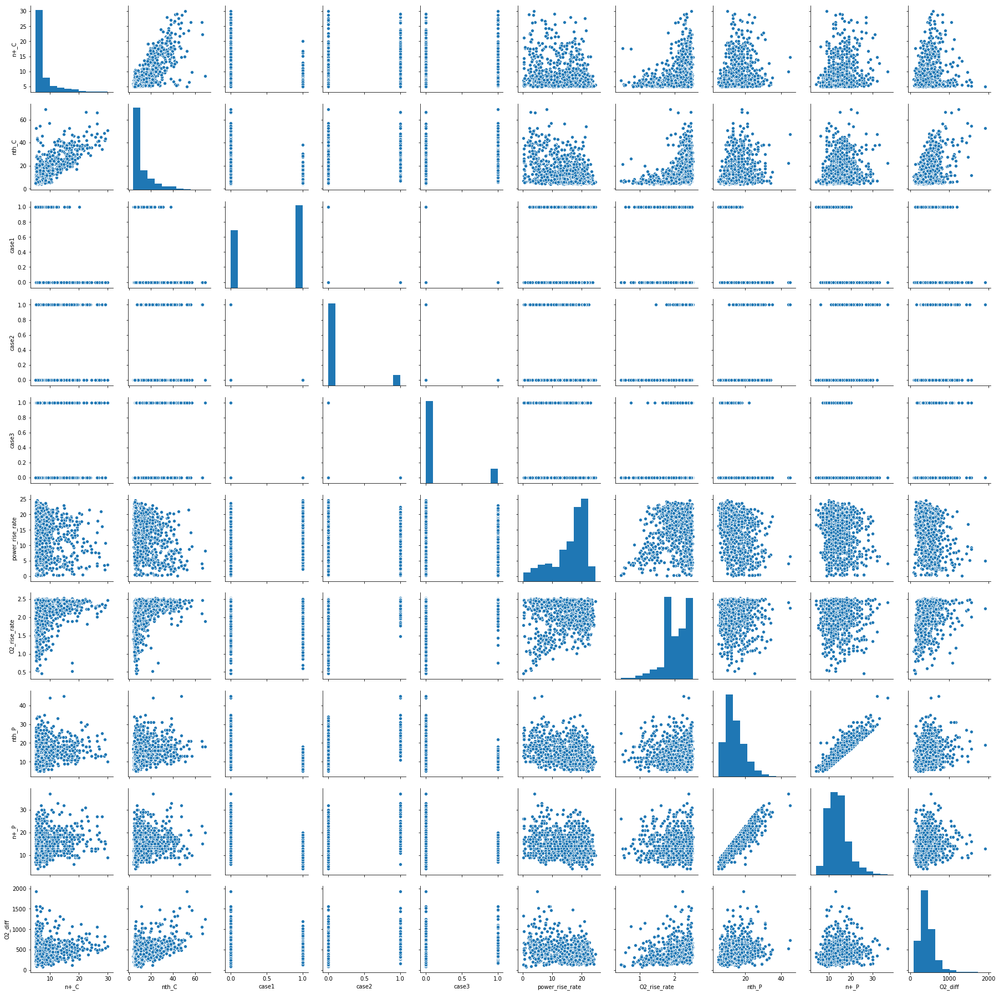

In [52]:
sns.pairplot(df_C_P_temp_train_valid[['n+_C', 'nth_C', 'case1', 'case2', 'case3', 'power_rise_rate', 'O2_rise_rate', 'nth_P', 'n+_P', 'O2_diff']])

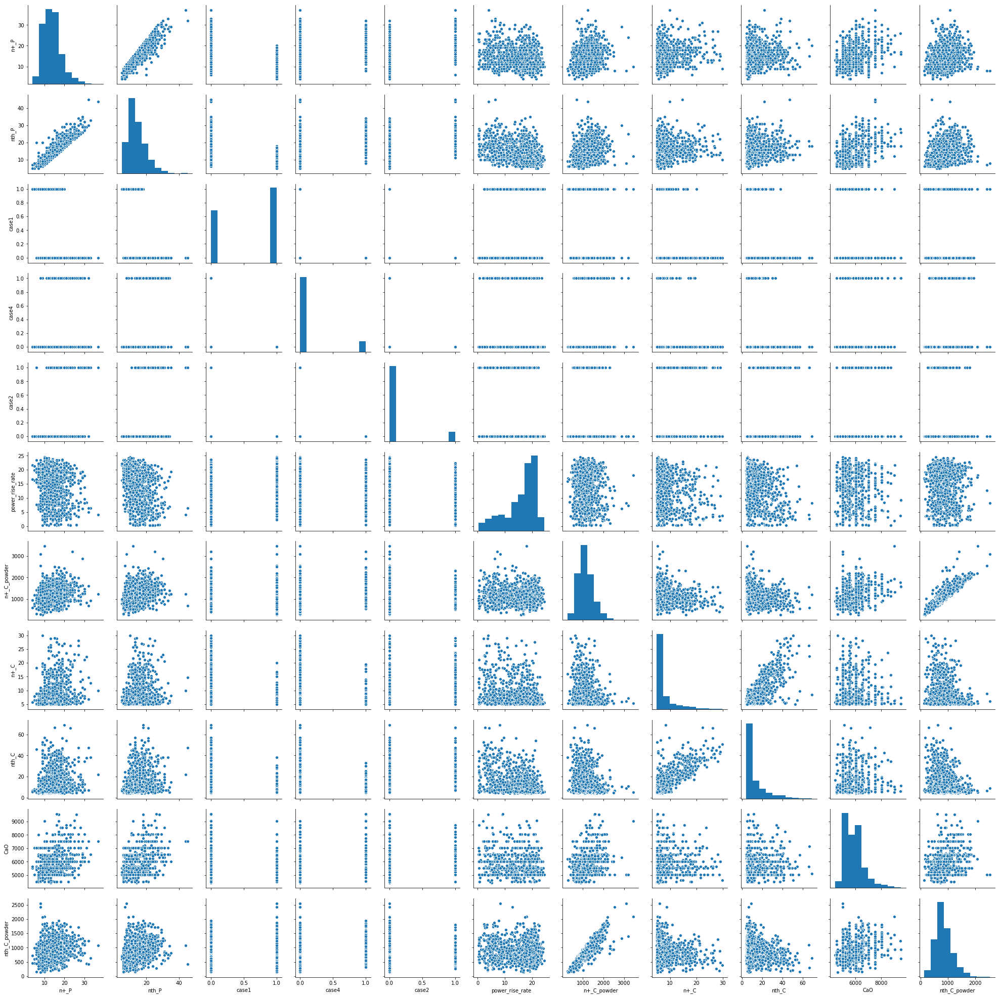

In [53]:
sns.pairplot(df_C_P_temp_train_valid[['n+_P', 'nth_P', 'case1', 'case4', 'case2', 'power_rise_rate', 'n+_C_powder', 'n+_C', 'nth_C', 'CaO', 'nth_C_powder']])

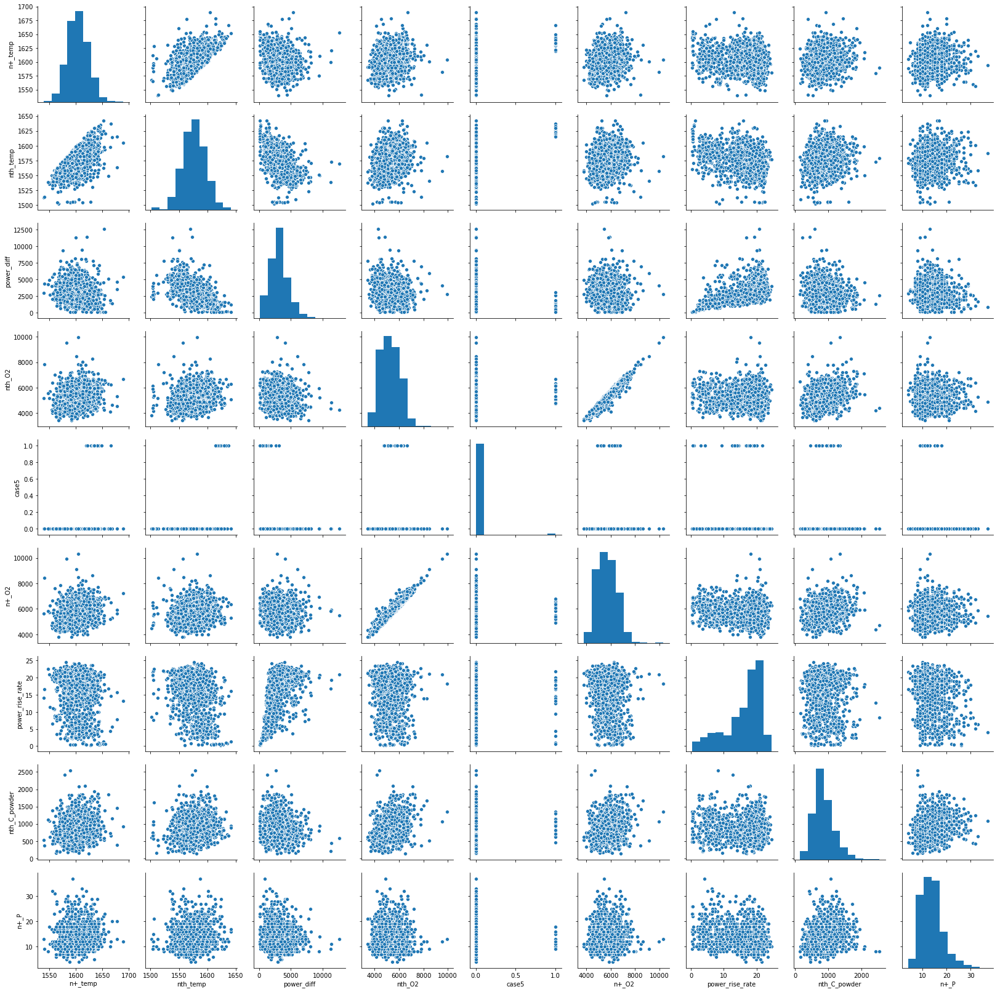

In [54]:
sns.pairplot(df_C_P_temp_train_valid[['n+_temp', 'nth_temp', 'power_diff', 'nth_O2', 'case5', 'n+_O2', 'power_rise_rate', 'nth_C_powder', 'n+_P']])

# Model 1 & 2 - predict total_O2 & tatol_power

# Model1_Training

In [43]:
df_O2_power_train_valid.columns

Index(['HM_temp', 'HM_Si', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat',
       'one_twin_heat', 'C_GK', 'P_GK', 'G1', 'G2', 'G3', 'G4', 'G5', 'G6',
       'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 'nth_temp',
       'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG', 'nth_C_powder',
       'nth_C', 'n+_C', 'n+_temp', 'n+_power', 'n+_O2'],
      dtype='object')

In [44]:
X_O2_power_train_valid = df_O2_power_train_valid.drop(['n+_O2', 'n+_power'], axis=1)
y_O2_train_valid = df_O2_power_train_valid['n+_O2']
y_power_train_valid = df_O2_power_train_valid['n+_power']

In [45]:
X_O2_power_train_valid.shape

(1473, 29)

In [46]:
X_O2_power_test = df_O2_power_test.drop(['n+_O2', 'n+_power'], axis=1)
y_O2_test = df_O2_power_test['n+_O2']
y_power_test = df_O2_power_test['n+_power']
X_O2_power_test.shape

(439, 29)

In [47]:
from sklearn.model_selection import train_test_split
X_O2_train, X_O2_valid, y_O2_train, y_O2_valid = train_test_split(X_O2_power_train_valid, y_O2_train_valid, test_size=0.25, random_state=101)

In [48]:
from sklearn import metrics
from sklearn.metrics import r2_score

In [49]:
import xgboost as xgb
print(xgb.__version__)  # xgboost version = 0.81
xgb_O2 = xgb.XGBRegressor()
xgb_O2.fit(X_O2_train, y_O2_train) 
y_O2_valid_pred = xgb_O2.predict(X_O2_valid)

0.81


In [50]:
print('MAE:', np.round(metrics.mean_absolute_error(y_O2_valid, y_O2_valid_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_O2_valid, y_O2_valid_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_O2_valid, y_O2_valid_pred)),2))
print('R squared: ', np.round(r2_score(y_O2_valid, y_O2_valid_pred),2))

MAE: 123.63
MSE: 51809.43
RMSE: 227.62
R squared:  0.94


In [54]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_O2_valid, y_O2_valid_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_O2_valid, y_O2_valid_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_O2_valid, y_O2_valid_pred)),2))
# print('R squared: ', np.round(r2_score(y_O2_valid, y_O2_valid_pred),2))

MAE: 163.47
MSE: 59783.56
RMSE: 244.51
R squared:  0.9


In [52]:
valid_O2_variance = y_O2_valid - y_O2_valid_pred
in_200 = np.abs(valid_O2_variance)<=200
print('驗證集誤差200 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_200])/valid_O2_variance.shape[0]*100,2),'%')
in_300 = np.abs(valid_O2_variance)<=300
print('驗證集誤差300 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_300])/valid_O2_variance.shape[0]*100,2),'%')
in_400 = np.abs(valid_O2_variance)<=400
print('驗證集誤差400 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_400])/valid_O2_variance.shape[0]*100,2),'%')

驗證集誤差200 m3 以內比例: 88.35 %
驗證集誤差300 m3 以內比例: 93.22 %
驗證集誤差400 m3 以內比例: 95.66 %


In [56]:
# valid_O2_variance = y_O2_valid - y_O2_valid_pred
# in_200 = np.abs(valid_O2_variance)<=200
# print('驗證集誤差200 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_200])/valid_O2_variance.shape[0]*100,2),'%')
# in_300 = np.abs(valid_O2_variance)<=300
# print('驗證集誤差300 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_300])/valid_O2_variance.shape[0]*100,2),'%')
# in_400 = np.abs(valid_O2_variance)<=400
# print('驗證集誤差400 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_400])/valid_O2_variance.shape[0]*100,2),'%')

驗證集誤差200 m3 以內比例: 74.91 %
驗證集誤差300 m3 以內比例: 87.11 %
驗證集誤差400 m3 以內比例: 92.33 %


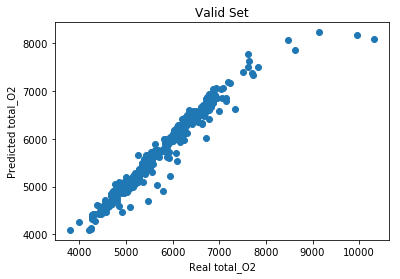

In [53]:
plt.scatter(y_O2_valid, y_O2_valid_pred)
plt.xlabel('Real total_O2')
plt.ylabel('Predicted total_O2') 
plt.title("Valid Set")
plt.show()

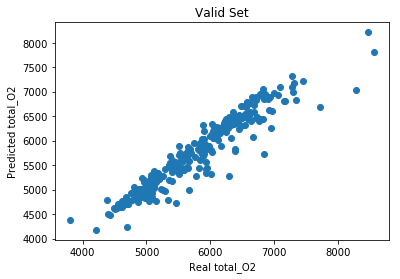

In [57]:
# plt.scatter(y_O2_valid, y_O2_valid_pred)
# plt.xlabel('Real total_O2')
# plt.ylabel('Predicted total_O2') 
# plt.title("Valid Set")
# plt.show()

In [54]:
y_O2_test_pred = xgb_O2.predict(X_O2_power_test)

In [55]:
print('MAE:', np.round(metrics.mean_absolute_error(y_O2_test, y_O2_test_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_O2_test, y_O2_test_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_O2_test, y_O2_test_pred)),2))
print('R squared: ', np.round(r2_score(y_O2_test, y_O2_test_pred),2))

MAE: 107.27
MSE: 21099.71
RMSE: 145.26
R squared:  0.97


In [59]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_O2_test, y_O2_test_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_O2_test, y_O2_test_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_O2_test, y_O2_test_pred)),2))
# print('R squared: ', np.round(r2_score(y_O2_test, y_O2_test_pred),2))

MAE: 160.25
MSE: 53414.13
RMSE: 231.11
R squared:  0.93


In [57]:
test_O2_variance = y_O2_test - y_O2_test_pred
in_200 = np.abs(test_O2_variance)<=200
print('測試集誤差200 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_200])/test_O2_variance.shape[0]*100,2),'%')
in_300 = np.abs(test_O2_variance)<=300
print('測試集誤差300 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_300])/test_O2_variance.shape[0]*100,2),'%')
in_400 = np.abs(test_O2_variance)<=400
print('測試集誤差400 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_400])/test_O2_variance.shape[0]*100,2),'%')

測試集誤差200 m3 以內比例: 87.93 %
測試集誤差300 m3 以內比例: 94.31 %
測試集誤差400 m3 以內比例: 97.27 %


In [60]:
# test_O2_variance = y_O2_test - y_O2_test_pred
# in_200 = np.abs(test_O2_variance)<=200
# print('測試集誤差200 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_200])/test_O2_variance.shape[0]*100,2),'%')
# in_300 = np.abs(test_O2_variance)<=300
# print('測試集誤差300 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_300])/test_O2_variance.shape[0]*100,2),'%')
# in_400 = np.abs(test_O2_variance)<=400
# print('測試集誤差400 m3 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_400])/test_O2_variance.shape[0]*100,2),'%')

測試集誤差200 m3 以內比例: 72.39 %
測試集誤差300 m3 以內比例: 87.42 %
測試集誤差400 m3 以內比例: 92.33 %


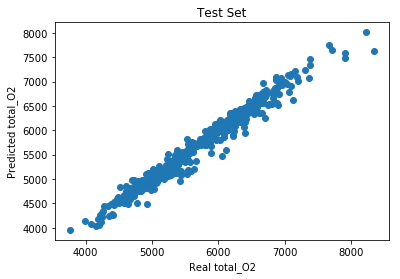

In [58]:
plt.scatter(y_O2_test, y_O2_test_pred)
plt.xlabel('Real total_O2')
plt.ylabel('Predicted total_O2') 
plt.title("Test Set")
plt.show()

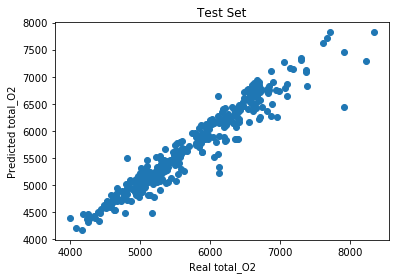

In [61]:
# plt.scatter(y_O2_test, y_O2_test_pred)
# plt.xlabel('Real total_O2')
# plt.ylabel('Predicted total_O2') 
# plt.title("Test Set")
# plt.show()

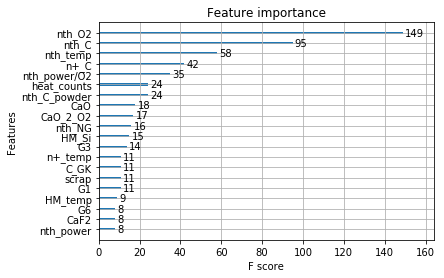

In [59]:
xgb.plot_importance(xgb_O2, max_num_features=20)

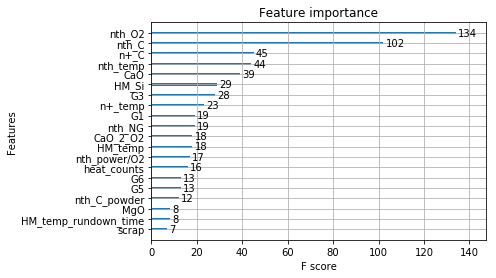

In [62]:
# xgb.plot_importance(xgb_O2, max_num_features=20)

# [Model1_Shap_analysis](#1.Model1_Shap_analysis)

# Model2_Training

In [88]:
X_power_train, X_power_valid, y_power_train, y_power_valid = train_test_split(X_O2_power_train_valid, y_power_train_valid, test_size=0.25, random_state=101)

In [89]:
X_power_train.shape, X_power_valid.shape, y_power_train.shape, y_power_valid.shape

((1104, 29), (369, 29), (1104,), (369,))

In [90]:
xgb_power = xgb.XGBRegressor()
xgb_power.fit(X_power_train, y_power_train) 
y_power_valid_pred = xgb_power.predict(X_power_valid)

In [91]:
print('MAE:', np.round(metrics.mean_absolute_error(y_power_valid, y_power_valid_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_power_valid, y_power_valid_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_power_valid, y_power_valid_pred)),2))
print('R squared: ', np.round(r2_score(y_power_valid, y_power_valid_pred),2))

MAE: 862.46
MSE: 1511699.3
RMSE: 1229.51
R squared:  0.97


In [66]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_power_valid, y_power_valid_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_power_valid, y_power_valid_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_power_valid, y_power_valid_pred)),2))
# print('R squared: ', np.round(r2_score(y_power_valid, y_power_valid_pred),2))

MAE: 1164.43
MSE: 2873920.17
RMSE: 1695.26
R squared:  0.95


In [92]:
valid_power_variance = y_power_valid - y_power_valid_pred
in_2000 = np.abs(valid_power_variance)<=2000
print('驗證集誤差2000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2000])/valid_power_variance.shape[0]*100,2),'%')
in_3000 = np.abs(valid_power_variance)<=3000
print('驗證集誤差3000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3000])/valid_power_variance.shape[0]*100,2),'%')
in_4000 = np.abs(valid_power_variance)<=4000
print('驗證集誤差4000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_4000])/valid_power_variance.shape[0]*100,2),'%')

驗證集誤差2000 kwh 以內比例: 93.77 %
驗證集誤差3000 kwh 以內比例: 97.56 %
驗證集誤差4000 kwh 以內比例: 99.19 %


In [67]:
# valid_power_variance = y_power_valid - y_power_valid_pred
# in_2000 = np.abs(valid_power_variance)<=2000
# print('驗證集誤差2000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2000])/valid_power_variance.shape[0]*100,2),'%')
# in_3000 = np.abs(valid_power_variance)<=3000
# print('驗證集誤差3000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3000])/valid_power_variance.shape[0]*100,2),'%')
# in_4000 = np.abs(valid_power_variance)<=4000
# print('驗證集誤差4000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_4000])/valid_power_variance.shape[0]*100,2),'%')

驗證集誤差2000 kwh 以內比例: 83.97 %
驗證集誤差3000 kwh 以內比例: 93.03 %
驗證集誤差4000 kwh 以內比例: 96.52 %


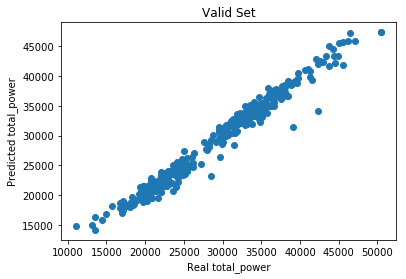

In [93]:
plt.scatter(y_power_valid, y_power_valid_pred)
plt.xlabel('Real total_power')
plt.ylabel('Predicted total_power') 
plt.title("Valid Set")
plt.show()

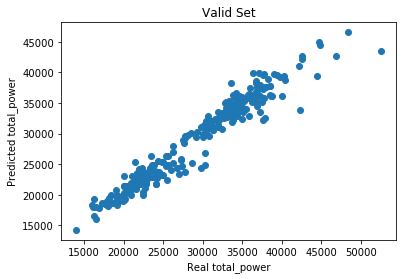

In [68]:
# plt.scatter(y_power_valid, y_power_valid_pred)
# plt.xlabel('Real total_power')
# plt.ylabel('Predicted total_power') 
# plt.title("Valid Set")
# plt.show()

In [94]:
y_power_test_pred = xgb_power.predict(X_O2_power_test)

In [95]:
print('MAE:', np.round(metrics.mean_absolute_error(y_power_test, y_power_test_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_power_test, y_power_test_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_power_test, y_power_test_pred)),2))
print('R squared: ', np.round(r2_score(y_power_test, y_power_test_pred),2))

MAE: 1098.41
MSE: 3333223.23
RMSE: 1825.71
R squared:  0.96


In [70]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_power_test, y_power_test_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_power_test, y_power_test_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_power_test, y_power_test_pred)),2))
# print('R squared: ', np.round(r2_score(y_power_test, y_power_test_pred),2))

MAE: 1284.64
MSE: 3635607.42
RMSE: 1906.73
R squared:  0.95


In [96]:
test_power_variance = y_power_test - y_power_test_pred
in_2000 = np.abs(test_power_variance)<=2000
print('測試集誤差2000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2000])/test_power_variance.shape[0]*100,2),'%')
in_3000 = np.abs(test_power_variance)<=3000
print('測試集誤差3000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3000])/test_power_variance.shape[0]*100,2),'%')
in_4000 = np.abs(test_power_variance)<=4000
print('測試集誤差4000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_4000])/test_power_variance.shape[0]*100,2),'%')

測試集誤差2000 kwh 以內比例: 89.75 %
測試集誤差3000 kwh 以內比例: 95.9 %
測試集誤差4000 kwh 以內比例: 97.49 %


In [71]:
# test_power_variance = y_power_test - y_power_test_pred
# in_2000 = np.abs(test_power_variance)<=2000
# print('測試集誤差2000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2000])/test_power_variance.shape[0]*100,2),'%')
# in_3000 = np.abs(test_power_variance)<=3000
# print('測試集誤差3000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3000])/test_power_variance.shape[0]*100,2),'%')
# in_4000 = np.abs(test_power_variance)<=4000
# print('測試集誤差4000 kwh 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_4000])/test_power_variance.shape[0]*100,2),'%')

測試集誤差2000 kwh 以內比例: 80.98 %
測試集誤差3000 kwh 以內比例: 91.1 %
測試集誤差4000 kwh 以內比例: 95.71 %


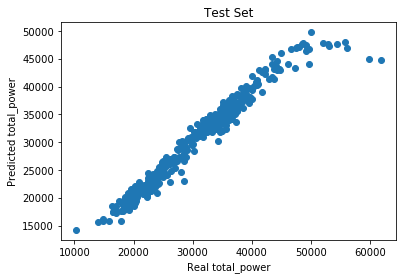

In [79]:
plt.scatter(y_power_test, y_power_test_pred)
plt.xlabel('Real total_power')
plt.ylabel('Predicted total_power') 
plt.title("Test Set")
plt.show()

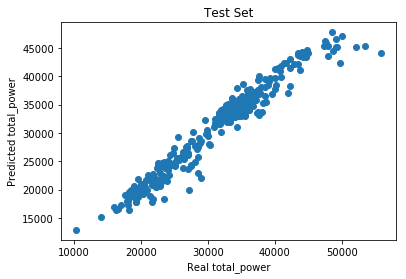

In [72]:
# plt.scatter(y_power_test, y_power_test_pred)
# plt.xlabel('Real total_power')
# plt.ylabel('Predicted total_power') 
# plt.title("Test Set")
# plt.show()

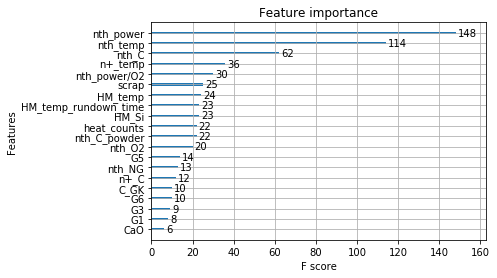

In [80]:
xgb.plot_importance(xgb_power, max_num_features=20)

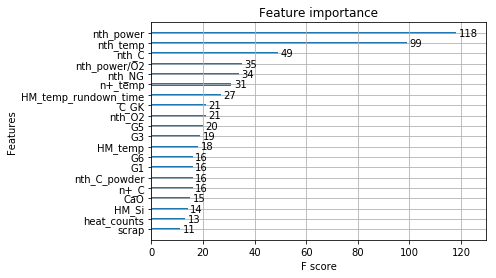

In [73]:
# xgb.plot_importance(xgb_power, max_num_features=20)

# [Model2_Shap_analysis](#2.Model2_Shap_analysis)

# Deployment Simulation

In [81]:
X_O2_power_test.head()

,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,G2,...,CaO_2_O2,nth_temp,nth_power,nth_O2,nth_power/O2,nth_NG,nth_C_powder,nth_C,n+_C,n+_temp
3741,1498,312,123,979,0,2,14.0,25,69500.0,0.0,...,4465,1586,32000,5975,5.355649,920,705,8.13,6.39,1596
3742,1521,477,95,140,1,2,14.0,25,69500.0,0.0,...,2052,1559,31400,4082,7.692308,805,471,63.19,26.76,1603
3745,1491,347,123,981,0,2,14.0,25,71100.0,0.0,...,2392,1538,29600,4651,6.364223,615,672,48.33,27.16,1554
3746,1491,347,123,981,0,2,14.0,25,71100.0,0.0,...,2392,1554,31300,5217,5.999617,643,1004,27.16,8.29,1590
3752,1480,326,132,144,1,2,21.0,25,75000.0,0.0,...,2810,1570,32800,5726,5.728257,717,1096,6.67,5.17,1603


In [82]:
X_O2_power_test_copy = X_O2_power_test.copy()

In [83]:
X_O2_power_test_copy.columns

Index(['HM_temp', 'HM_Si', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat',
       'one_twin_heat', 'C_GK', 'P_GK', 'G1', 'G2', 'G3', 'G4', 'G5', 'G6',
       'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 'nth_temp',
       'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG', 'nth_C_powder',
       'nth_C', 'n+_C', 'n+_temp'],
      dtype='object')

In [84]:
X_O2_power_test_copy['n+_C'] = X_O2_power_test_copy['n+_C'].apply(lambda x:int(6))
X_O2_power_test_copy['n+_temp'] = X_O2_power_test_copy['n+_temp'].apply(lambda x:int(1615))
X_O2_power_test_1615_6 = X_O2_power_test_copy
X_O2_power_test_1615_6.head()

,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,G2,...,CaO_2_O2,nth_temp,nth_power,nth_O2,nth_power/O2,nth_NG,nth_C_powder,nth_C,n+_C,n+_temp
3741,1498,312,123,979,0,2,14.0,25,69500.0,0.0,...,4465,1586,32000,5975,5.355649,920,705,8.13,6,1615
3742,1521,477,95,140,1,2,14.0,25,69500.0,0.0,...,2052,1559,31400,4082,7.692308,805,471,63.19,6,1615
3745,1491,347,123,981,0,2,14.0,25,71100.0,0.0,...,2392,1538,29600,4651,6.364223,615,672,48.33,6,1615
3746,1491,347,123,981,0,2,14.0,25,71100.0,0.0,...,2392,1554,31300,5217,5.999617,643,1004,27.16,6,1615
3752,1480,326,132,144,1,2,21.0,25,75000.0,0.0,...,2810,1570,32800,5726,5.728257,717,1096,6.67,6,1615


In [85]:
y_O2_test_1615_6_pred = xgb_O2.predict(X_O2_power_test_1615_6)
y_power_test_1615_6_pred = xgb_power.predict(X_O2_power_test_1615_6)

In [86]:
y_O2_test_1615_6_pred = pd.Series(data=y_O2_test_1615_6_pred)
y_power_test_1615_6_pred = pd.Series(data=y_power_test_1615_6_pred)

In [87]:
X_O2_power_test_1615_6 = X_O2_power_test_1615_6.reset_index()

In [88]:
df_O2_power_test_1615_6 = pd.concat([X_O2_power_test_1615_6, y_O2_test_1615_6_pred, y_power_test_1615_6_pred], axis=1)
df_O2_power_test_1615_6.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,nth_power,nth_O2,nth_power/O2,nth_NG,nth_C_powder,nth_C,n+_C,n+_temp,0,1
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,32000,5975,5.355649,920,705,8.13,6,1615,6368.781738,34399.996094
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,31400,4082,7.692308,805,471,63.19,6,1615,5351.316406,34097.687500
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,29600,4651,6.364223,615,672,48.33,6,1615,5821.664551,34009.792969
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,31300,5217,5.999617,643,1004,27.16,6,1615,6010.825195,34596.621094
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,32800,5726,5.728257,717,1096,6.67,6,1615,6107.601074,35912.472656


In [89]:
df_O2_power_test_1615_6.rename(columns={0: 'O2_1615_6_pred', 1: 'power_1615_6_pred'}, inplace=True)
df_O2_power_test_1615_6.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,nth_power,nth_O2,nth_power/O2,nth_NG,nth_C_powder,nth_C,n+_C,n+_temp,O2_1615_6_pred,power_1615_6_pred
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,32000,5975,5.355649,920,705,8.13,6,1615,6368.781738,34399.996094
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,31400,4082,7.692308,805,471,63.19,6,1615,5351.316406,34097.687500
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,29600,4651,6.364223,615,672,48.33,6,1615,5821.664551,34009.792969
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,31300,5217,5.999617,643,1004,27.16,6,1615,6010.825195,34596.621094
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,32800,5726,5.728257,717,1096,6.67,6,1615,6107.601074,35912.472656


# Combine & Export

In [90]:
y_O2_test_pred = pd.Series(data=y_O2_test_pred)
y_power_test_pred = pd.Series(data=y_power_test_pred)

In [91]:
y_O2_test = y_O2_test.reset_index()
y_power_test = y_power_test.reset_index()

In [92]:
X_O2_power_test = X_O2_power_test.reset_index()

In [93]:
df_O2_test = pd.merge(X_O2_power_test, y_O2_test, how='outer', on='index')
df_O2_power_test = pd.merge(df_O2_test, y_power_test, how='outer', on='index')

In [94]:
df_O2_power_test_pred = pd.concat([df_O2_power_test, y_O2_test_pred, y_O2_test_1615_6_pred, y_power_test_pred, y_power_test_1615_6_pred], axis=1)

In [95]:
df_O2_power_test_pred.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,nth_C_powder,nth_C,n+_C,n+_temp,n+_O2,n+_power,0,1,2,3
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,705,8.13,6.39,1596,6179,34000,6367.398438,6368.781738,34355.000000,34399.996094
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,471,63.19,26.76,1603,4610,32800,4849.940918,5351.316406,34079.765625,34097.687500
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,672,48.33,27.16,1554,5217,31300,5283.868652,5821.664551,32742.884766,34009.792969
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,1004,27.16,8.29,1590,5780,31700,5844.558594,6010.825195,34062.238281,34596.621094
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,1096,6.67,5.17,1603,6046,35300,6109.787109,6107.601074,35912.667969,35912.472656


In [96]:
df_O2_power_test_pred.rename(columns={0: 'n+_O2_pred', 1:'n+_O2_1615_6_pred', 2: 'n+_power_pred', 3:'n+_power_1615_6_pred'}, inplace=True)
df_O2_power_test_pred.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,nth_C_powder,nth_C,n+_C,n+_temp,n+_O2,n+_power,n+_O2_pred,n+_O2_1615_6_pred,n+_power_pred,n+_power_1615_6_pred
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,705,8.13,6.39,1596,6179,34000,6367.398438,6368.781738,34355.000000,34399.996094
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,471,63.19,26.76,1603,4610,32800,4849.940918,5351.316406,34079.765625,34097.687500
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,672,48.33,27.16,1554,5217,31300,5283.868652,5821.664551,32742.884766,34009.792969
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,1004,27.16,8.29,1590,5780,31700,5844.558594,6010.825195,34062.238281,34596.621094
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,1096,6.67,5.17,1603,6046,35300,6109.787109,6107.601074,35912.667969,35912.472656


In [97]:
df_O2_power_test_pred['n+_O2_variance'] = df_O2_power_test_pred['n+_O2_pred'] - df_O2_power_test_pred['n+_O2']
df_O2_power_test_pred['n+_power_variance'] = df_O2_power_test_pred['n+_power_pred'] - df_O2_power_test_pred['n+_power']
df_O2_power_test_pred.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,n+_C,n+_temp,n+_O2,n+_power,n+_O2_pred,n+_O2_1615_6_pred,n+_power_pred,n+_power_1615_6_pred,n+_O2_variance,n+_power_variance
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,6.39,1596,6179,34000,6367.398438,6368.781738,34355.000000,34399.996094,188.398438,355.000000
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,26.76,1603,4610,32800,4849.940918,5351.316406,34079.765625,34097.687500,239.940918,1279.765625
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,27.16,1554,5217,31300,5283.868652,5821.664551,32742.884766,34009.792969,66.868652,1442.884766
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,8.29,1590,5780,31700,5844.558594,6010.825195,34062.238281,34596.621094,64.558594,2362.238281
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,5.17,1603,6046,35300,6109.787109,6107.601074,35912.667969,35912.472656,63.787109,612.667969


/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


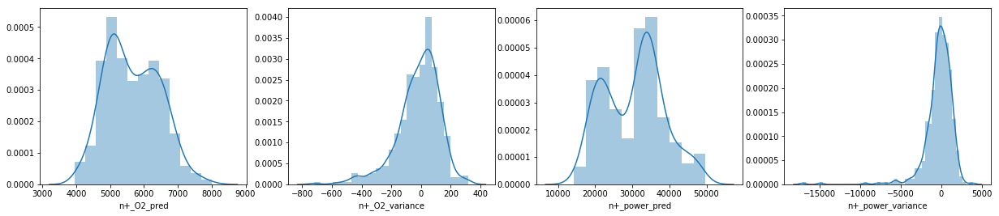

In [98]:
plt.figure(figsize=(21, 4))
plt.subplot(1,4,1)
sns.distplot(df_O2_power_test_pred['n+_O2_pred'])
plt.subplot(1,4,2)
sns.distplot(df_O2_power_test_pred['n+_O2_variance'])
plt.subplot(1,4,3)
sns.distplot(df_O2_power_test_pred['n+_power_pred'])
plt.subplot(1,4,4)
sns.distplot(df_O2_power_test_pred['n+_power_variance'])

In [99]:
df_O2_power_info = df_O2_power[info_list]
df_O2_power_info.head() 

,month,heatno
1,110-08月,XL559
8,110-08月,VL570
11,110-08月,VL575
15,110-08月,VL579
16,110-08月,VL580


In [100]:
df_O2_power_info = df_O2_power_info.reset_index()
df_O2_power_info.head()

,index,month,heatno
0,1,110-08月,XL559
1,8,110-08月,VL570
2,11,110-08月,VL575
3,15,110-08月,VL579
4,16,110-08月,VL580


In [101]:
df_O2_power_output = pd.merge(df_O2_power_info, df_O2_power_test_pred, how='inner', on='index')
df_O2_power_output.head()

,index,month,heatno,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,...,n+_C,n+_temp,n+_O2,n+_power,n+_O2_pred,n+_O2_1615_6_pred,n+_power_pred,n+_power_1615_6_pred,n+_O2_variance,n+_power_variance
0,3741,111-05,VQ824,1498,312,123,979,0,2,14.0,...,6.39,1596,6179,34000,6367.398438,6368.781738,34355.000000,34399.996094,188.398438,355.000000
1,3742,111-05,XQ825,1521,477,95,140,1,2,14.0,...,26.76,1603,4610,32800,4849.940918,5351.316406,34079.765625,34097.687500,239.940918,1279.765625
2,3745,111-05,VQ828,1491,347,123,981,0,2,14.0,...,27.16,1554,5217,31300,5283.868652,5821.664551,32742.884766,34009.792969,66.868652,1442.884766
3,3746,111-05,VQ828,1491,347,123,981,0,2,14.0,...,8.29,1590,5780,31700,5844.558594,6010.825195,34062.238281,34596.621094,64.558594,2362.238281
4,3752,111-05,XQ832,1480,326,132,144,1,2,21.0,...,5.17,1603,6046,35300,6109.787109,6107.601074,35912.667969,35912.472656,63.787109,612.667969


In [102]:
df_O2_power_output.columns

Index(['index', 'month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time',
       'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK', 'P_GK', 'G1', 'G2',
       'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke',
       'CaO_2_O2', 'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG',
       'nth_C_powder', 'nth_C', 'n+_C', 'n+_temp', 'n+_O2', 'n+_power',
       'n+_O2_pred', 'n+_O2_1615_6_pred', 'n+_power_pred',
       'n+_power_1615_6_pred', 'n+_O2_variance', 'n+_power_variance'],
      dtype='object')

In [103]:
df_O2_power_output = df_O2_power_output[['index', 'month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time',
                                         'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK','P_GK', 
                                        'G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2',
                                        'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'n+_temp', 'n+_C',
                                        'n+_O2', 'n+_O2_pred', 'n+_O2_variance', 'n+_O2_1615_6_pred', 
                                         'n+_power', 'n+_power_pred', 'n+_power_variance', 'n+_power_1615_6_pred']]

In [104]:
df_O2_power_output.head()

,index,month,heatno,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,...,n+_temp,n+_C,n+_O2,n+_O2_pred,n+_O2_variance,n+_O2_1615_6_pred,n+_power,n+_power_pred,n+_power_variance,n+_power_1615_6_pred
0,3741,111-05,VQ824,1498,312,123,979,0,2,14.0,...,1596,6.39,6179,6367.398438,188.398438,6368.781738,34000,34355.000000,355.000000,34399.996094
1,3742,111-05,XQ825,1521,477,95,140,1,2,14.0,...,1603,26.76,4610,4849.940918,239.940918,5351.316406,32800,34079.765625,1279.765625,34097.687500
2,3745,111-05,VQ828,1491,347,123,981,0,2,14.0,...,1554,27.16,5217,5283.868652,66.868652,5821.664551,31300,32742.884766,1442.884766,34009.792969
3,3746,111-05,VQ828,1491,347,123,981,0,2,14.0,...,1590,8.29,5780,5844.558594,64.558594,6010.825195,31700,34062.238281,2362.238281,34596.621094
4,3752,111-05,XQ832,1480,326,132,144,1,2,21.0,...,1603,5.17,6046,6109.787109,63.787109,6107.601074,35300,35912.667969,612.667969,35912.472656


In [94]:
# df_O2_power_output.to_excel('1110620_O2_power_pred.xlsx', index=False)

# Model 3、4、5 - predict C、P、temp

In [105]:
df_C_P_temp_train_valid.columns

Index(['HM_temp', 'HM_Si', 'HM_temp_rundown_time', 'heat_counts', 'AB_heat',
       'one_twin_heat', 'C_GK', 'P_GK', 'G1', 'G2', 'G3', 'G4', 'G5', 'G6',
       'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2', 'case1', 'case2',
       'case3', 'case4', 'case5', 'case6', 'case7', 'case8', 'time_diff',
       'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG',
       'nth_C_powder', 'nth_C', 'nth_P', 'n+_power', 'power_diff',
       'power_rise_rate', 'n+_O2', 'O2_diff', 'O2_rise_rate', 'n+_power/O2',
       'n+_NG', 'n+_C_powder', 'n+_C', 'n+_P', 'n+_temp'],
      dtype='object')

In [106]:
X_C_temp_train_valid = df_C_P_temp_train_valid.drop(['n+_C', 'nth_P', 'n+_P', 'n+_temp'], axis=1)
X_P_train_valid = df_C_P_temp_train_valid.drop(['n+_C', 'n+_P', 'n+_temp'], axis=1)
y_C_train_valid = df_C_P_temp_train_valid['n+_C']
y_P_train_valid = df_C_P_temp_train_valid['n+_P']
y_temp_train_valid = df_C_P_temp_train_valid['n+_temp']

In [107]:
X_C_temp_train_valid.shape

(1473, 45)

In [108]:
X_C_temp_test = df_C_P_temp_test.drop(['n+_C', 'nth_P', 'n+_P', 'n+_temp'], axis=1)
X_P_test = df_C_P_temp_test.drop(['n+_C', 'n+_P', 'n+_temp'], axis=1)
y_C_test = df_C_P_temp_test['n+_C']
y_P_test = df_C_P_temp_test['n+_P']
y_temp_test = df_C_P_temp_test['n+_temp']

In [109]:
X_C_temp_test.shape

(439, 45)

In [110]:
X_C_train, X_C_valid, y_C_train, y_C_valid = train_test_split(X_C_temp_train_valid, y_C_train_valid, test_size=0.25, random_state=101)
X_C_train.shape, X_C_valid.shape, y_C_train.shape, y_C_valid.shape

((1104, 45), (369, 45), (1104,), (369,))

In [111]:
xgb_C = xgb.XGBRegressor()
xgb_C.fit(X_C_train, y_C_train) 
y_C_valid_pred = xgb_C.predict(X_C_valid)

In [112]:
print('MAE:', np.round(metrics.mean_absolute_error(y_C_valid, y_C_valid_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_C_valid, y_C_valid_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_C_valid, y_C_valid_pred)),2))
print('R squared: ', np.round(r2_score(y_C_valid, y_C_valid_pred),2))

MAE: 1.22
MSE: 4.21
RMSE: 2.05
R squared:  0.72


In [106]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_C_valid, y_C_valid_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_C_valid, y_C_valid_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_C_valid, y_C_valid_pred)),2))
# print('R squared: ', np.round(r2_score(y_C_valid, y_C_valid_pred),2))

MAE: 1.17
MSE: 3.65
RMSE: 1.91
R squared:  0.52


In [113]:
valid_C_variance = y_C_valid - y_C_valid_pred
in_05 = np.abs(valid_C_variance)<=0.5
print('驗證集誤差0.5點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_05])/valid_C_variance.shape[0]*100,2),'%')
in_1 = np.abs(valid_C_variance)<=1
print('驗證集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/valid_C_variance.shape[0]*100,2),'%')
in_2 = np.abs(valid_C_variance)<=2
print('驗證集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/valid_C_variance.shape[0]*100,2),'%')

驗證集誤差0.5點以內比例: 36.31 %
驗證集誤差1點以內比例: 65.85 %
驗證集誤差2點以內比例: 84.28 %


In [107]:
# valid_C_variance = y_C_valid - y_C_valid_pred
# in_05 = np.abs(valid_C_variance)<=0.5
# print('驗證集誤差0.5點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_05])/valid_C_variance.shape[0]*100,2),'%')
# in_1 = np.abs(valid_C_variance)<=1
# print('驗證集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/valid_C_variance.shape[0]*100,2),'%')
# in_2 = np.abs(valid_C_variance)<=2
# print('驗證集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/valid_C_variance.shape[0]*100,2),'%')

驗證集誤差0.5點以內比例: 39.02 %
驗證集誤差1點以內比例: 66.2 %
驗證集誤差2點以內比例: 84.32 %


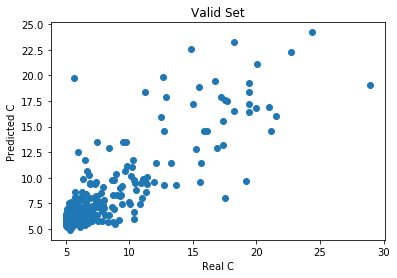

In [114]:
plt.scatter(y_C_valid, y_C_valid_pred)
plt.xlabel('Real C')
plt.ylabel('Predicted C') 
plt.title("Valid Set")
plt.show()

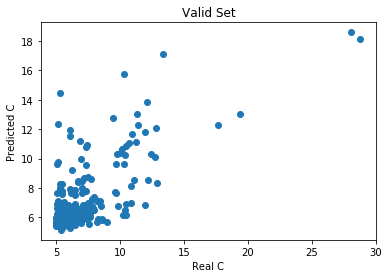

In [108]:
# plt.scatter(y_C_valid, y_C_valid_pred)
# plt.xlabel('Real C')
# plt.ylabel('Predicted C') 
# plt.title("Valid Set")
# plt.show()

In [115]:
y_C_test_pred = xgb_C.predict(X_C_temp_test)

In [116]:
print('MAE:', np.round(metrics.mean_absolute_error(y_C_test, y_C_test_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_C_test, y_C_test_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_C_test, y_C_test_pred)),2))
print('R squared: ', np.round(r2_score(y_C_test, y_C_test_pred),2))

MAE: 1.2
MSE: 3.91
RMSE: 1.98
R squared:  0.74


In [110]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_C_test, y_C_test_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_C_test, y_C_test_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_C_test, y_C_test_pred)),2))
# print('R squared: ', np.round(r2_score(y_C_test, y_C_test_pred),2))

MAE: 1.01
MSE: 3.07
RMSE: 1.75
R squared:  0.54


In [117]:
test_C_variance = y_C_test - y_C_test_pred
in_05 = np.abs(test_C_variance)<=0.5
print('測試集誤差0.5點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_05])/test_C_variance.shape[0]*100,2),'%')
in_1 = np.abs(test_C_variance)<=1
print('測試集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/test_C_variance.shape[0]*100,2),'%')
in_2 = np.abs(test_C_variance)<=2
print('測試集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/test_C_variance.shape[0]*100,2),'%')

測試集誤差0.5點以內比例: 38.5 %
測試集誤差1點以內比例: 65.38 %
測試集誤差2點以內比例: 83.83 %


In [111]:
# test_C_variance = y_C_test - y_C_test_pred
# in_05 = np.abs(test_C_variance)<=0.5
# print('測試集誤差0.5點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_05])/test_C_variance.shape[0]*100,2),'%')
# in_1 = np.abs(test_C_variance)<=1
# print('測試集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/test_C_variance.shape[0]*100,2),'%')
# in_2 = np.abs(test_C_variance)<=2
# print('測試集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/test_C_variance.shape[0]*100,2),'%')

測試集誤差0.5點以內比例: 45.4 %
測試集誤差1點以內比例: 70.55 %
測試集誤差2點以內比例: 88.04 %


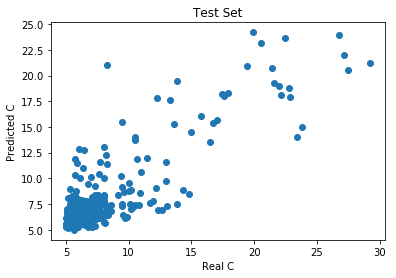

In [118]:
plt.scatter(y_C_test, y_C_test_pred)
plt.xlabel('Real C')
plt.ylabel('Predicted C') 
plt.title("Test Set")
plt.show()

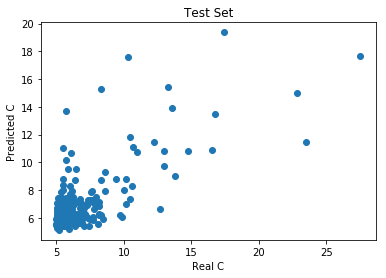

In [112]:
# plt.scatter(y_C_test, y_C_test_pred)
# plt.xlabel('Real C')
# plt.ylabel('Predicted C') 
# plt.title("Test Set")
# plt.show()

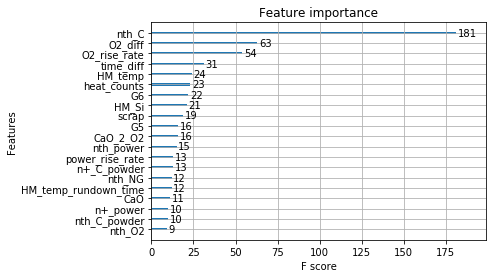

In [119]:
xgb.plot_importance(xgb_C, max_num_features=20)

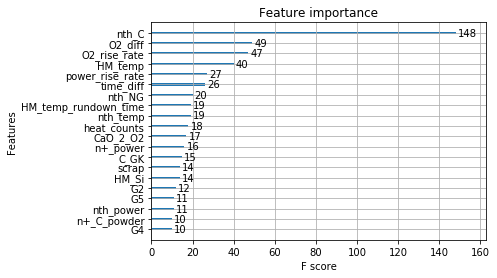

In [113]:
# xgb.plot_importance(xgb_C, max_num_features=20)

In [120]:
X_P_train, X_P_valid, y_P_train, y_P_valid = train_test_split(X_P_train_valid, y_P_train_valid, test_size=0.25, random_state=101)
X_P_train.shape, X_P_valid.shape, y_P_train.shape, y_P_valid.shape

((1104, 46), (369, 46), (1104,), (369,))

In [121]:
xgb_P = xgb.XGBRegressor()
xgb_P.fit(X_P_train, y_P_train) 
y_P_valid_pred = xgb_P.predict(X_P_valid)

In [122]:
print('MAE:', np.round(metrics.mean_absolute_error(y_P_valid, y_P_valid_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_P_valid, y_P_valid_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_P_valid, y_P_valid_pred)),2))
print('R squared: ', np.round(r2_score(y_P_valid, y_P_valid_pred),2))

MAE: 1.34
MSE: 3.69
RMSE: 1.92
R squared:  0.8


In [116]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_P_valid, y_P_valid_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_P_valid, y_P_valid_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_P_valid, y_P_valid_pred)),2))
# print('R squared: ', np.round(r2_score(y_P_valid, y_P_valid_pred),2))

MAE: 1.26
MSE: 2.69
RMSE: 1.64
R squared:  0.79


In [123]:
valid_P_variance = y_P_valid - y_P_valid_pred
in_1 = np.abs(valid_P_variance)<=1
print('驗證集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/valid_P_variance.shape[0]*100,2),'%')
in_2 = np.abs(valid_P_variance)<=2
print('驗證集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/valid_P_variance.shape[0]*100,2),'%')
in_3 = np.abs(valid_P_variance)<=3
print('驗證集誤差3點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3])/valid_P_variance.shape[0]*100,2),'%')

驗證集誤差1點以內比例: 51.49 %
驗證集誤差2點以內比例: 80.76 %
驗證集誤差3點以內比例: 91.33 %


In [122]:
# valid_P_variance = y_P_valid - y_P_valid_pred
# in_1 = np.abs(valid_P_variance)<=1
# print('驗證集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/valid_P_variance.shape[0]*100,2),'%')
# in_2 = np.abs(valid_P_variance)<=2
# print('驗證集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/valid_P_variance.shape[0]*100,2),'%')
# in_3 = np.abs(valid_P_variance)<=3
# print('驗證集誤差3點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3])/valid_P_variance.shape[0]*100,2),'%')

驗證集誤差1點以內比例: 50.17 %
驗證集誤差2點以內比例: 80.84 %
驗證集誤差3點以內比例: 91.64 %


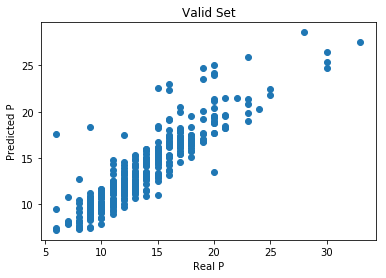

In [124]:
plt.scatter(y_P_valid, y_P_valid_pred)
plt.xlabel('Real P')
plt.ylabel('Predicted P') 
plt.title("Valid Set")
plt.show()

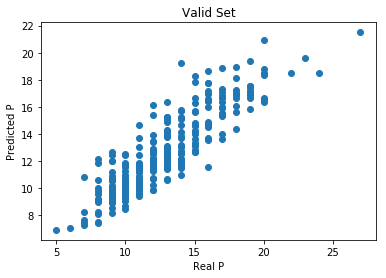

In [118]:
# plt.scatter(y_P_valid, y_P_valid_pred)
# plt.xlabel('Real P')
# plt.ylabel('Predicted P') 
# plt.title("Valid Set")
# plt.show()

In [125]:
y_P_test_pred = xgb_P.predict(X_P_test)

In [126]:
print('MAE:', np.round(metrics.mean_absolute_error(y_P_test, y_P_test_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_P_test, y_P_test_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_P_test, y_P_test_pred)),2))
print('R squared: ', np.round(r2_score(y_P_test, y_P_test_pred),2))

MAE: 1.35
MSE: 3.55
RMSE: 1.88
R squared:  0.83


In [120]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_P_test, y_P_test_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_P_test, y_P_test_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_P_test, y_P_test_pred)),2))
# print('R squared: ', np.round(r2_score(y_P_test, y_P_test_pred),2))

MAE: 1.24
MSE: 3.12
RMSE: 1.77
R squared:  0.71


In [127]:
test_P_variance = y_P_test - y_P_test_pred
in_1 = np.abs(test_P_variance)<=1
print('測試集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/test_P_variance.shape[0]*100,2),'%')
in_2 = np.abs(test_P_variance)<=2
print('測試集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/test_P_variance.shape[0]*100,2),'%')
in_3 = np.abs(test_P_variance)<=3
print('測試集誤差3點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3])/test_P_variance.shape[0]*100,2),'%')

測試集誤差1點以內比例: 48.52 %
測試集誤差2點以內比例: 79.04 %
測試集誤差3點以內比例: 92.48 %


In [121]:
# test_P_variance = y_P_test - y_P_test_pred
# in_1 = np.abs(test_P_variance)<=1
# print('測試集誤差1點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_1])/test_P_variance.shape[0]*100,2),'%')
# in_2 = np.abs(test_P_variance)<=2
# print('測試集誤差2點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_2])/test_P_variance.shape[0]*100,2),'%')
# in_3 = np.abs(test_P_variance)<=3
# print('測試集誤差3點以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_3])/test_P_variance.shape[0]*100,2),'%')

測試集誤差1點以內比例: 53.37 %
測試集誤差2點以內比例: 82.21 %
測試集誤差3點以內比例: 93.56 %


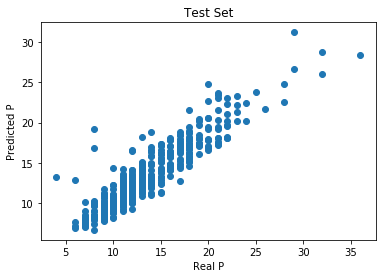

In [128]:
plt.scatter(y_P_test, y_P_test_pred)
plt.xlabel('Real P')
plt.ylabel('Predicted P') 
plt.title("Test Set")
plt.show()

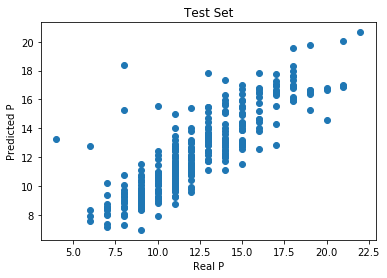

In [123]:
# plt.scatter(y_P_test, y_P_test_pred)
# plt.xlabel('Real P')
# plt.ylabel('Predicted P') 
# plt.title("Test Set")
# plt.show()

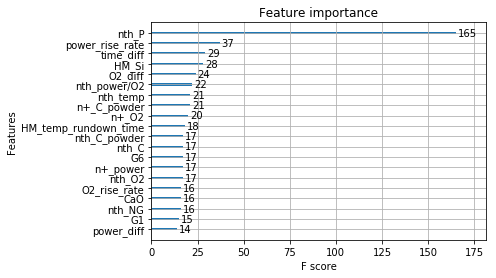

In [129]:
xgb.plot_importance(xgb_P, max_num_features=20)

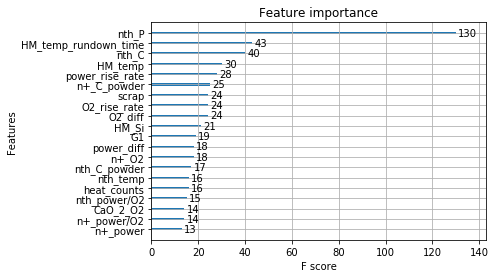

In [124]:
# xgb.plot_importance(xgb_P, max_num_features=20)

In [130]:
X_temp_train, X_temp_valid, y_temp_train, y_temp_valid = train_test_split(X_C_temp_train_valid, y_temp_train_valid, test_size=0.25, random_state=101)
X_temp_train.shape, X_temp_valid.shape, y_temp_train.shape, y_temp_valid.shape

((1104, 45), (369, 45), (1104,), (369,))

In [131]:
xgb_temp = xgb.XGBRegressor()
xgb_temp.fit(X_temp_train, y_temp_train) 
y_temp_valid_pred = xgb_temp.predict(X_temp_valid)

In [132]:
print('MAE:', np.round(metrics.mean_absolute_error(y_temp_valid, y_temp_valid_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_temp_valid, y_temp_valid_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_temp_valid, y_temp_valid_pred)),2))
print('R squared: ', np.round(r2_score(y_temp_valid, y_temp_valid_pred),2))

MAE: 11.43
MSE: 216.12
RMSE: 14.7
R squared:  0.42


In [127]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_temp_valid, y_temp_valid_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_temp_valid, y_temp_valid_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_temp_valid, y_temp_valid_pred)),2))
# print('R squared: ', np.round(r2_score(y_temp_valid, y_temp_valid_pred),2))

MAE: 12.12
MSE: 235.32
RMSE: 15.34
R squared:  0.31


In [133]:
valid_temp_variance = y_temp_valid - y_temp_valid_pred
in_10 = np.abs(valid_temp_variance)<=10
print('驗證集誤差10 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_10])/valid_temp_variance.shape[0]*100,2),'%')
in_20 = np.abs(valid_temp_variance)<=20
print('驗證集誤差20 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_20])/valid_temp_variance.shape[0]*100,2),'%')
in_30 = np.abs(valid_temp_variance)<=30
print('驗證集誤差30 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_30])/valid_temp_variance.shape[0]*100,2),'%')

驗證集誤差10 度C 以內比例: 51.49 %
驗證集誤差20 度C 以內比例: 84.28 %
驗證集誤差30 度C 以內比例: 95.39 %


In [128]:
# valid_temp_variance = y_temp_valid - y_temp_valid_pred
# in_10 = np.abs(valid_temp_variance)<=10
# print('驗證集誤差10 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_10])/valid_temp_variance.shape[0]*100,2),'%')
# in_20 = np.abs(valid_temp_variance)<=20
# print('驗證集誤差20 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_20])/valid_temp_variance.shape[0]*100,2),'%')
# in_30 = np.abs(valid_temp_variance)<=30
# print('驗證集誤差30 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_30])/valid_temp_variance.shape[0]*100,2),'%')

驗證集誤差10 度C 以內比例: 49.83 %
驗證集誤差20 度C 以內比例: 80.84 %
驗證集誤差30 度C 以內比例: 94.43 %


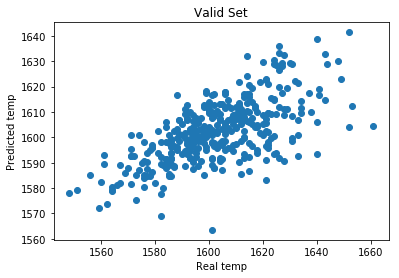

In [134]:
plt.scatter(y_temp_valid, y_temp_valid_pred)
plt.xlabel('Real temp')
plt.ylabel('Predicted temp') 
plt.title("Valid Set")
plt.show()

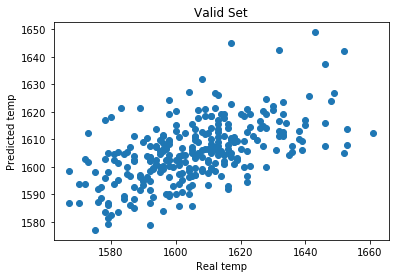

In [129]:
# plt.scatter(y_temp_valid, y_temp_valid_pred)
# plt.xlabel('Real temp')
# plt.ylabel('Predicted temp') 
# plt.title("Valid Set")
# plt.show()

In [135]:
y_temp_test_pred = xgb_temp.predict(X_C_temp_test)

In [136]:
print('MAE:', np.round(metrics.mean_absolute_error(y_temp_test, y_temp_test_pred),2))
print('MSE:', np.round(metrics.mean_squared_error(y_temp_test, y_temp_test_pred),2))
print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_temp_test, y_temp_test_pred)),2))
print('R squared: ', np.round(r2_score(y_temp_test, y_temp_test_pred),2))

MAE: 11.99
MSE: 216.65
RMSE: 14.72
R squared:  0.46


In [131]:
# print('MAE:', np.round(metrics.mean_absolute_error(y_temp_test, y_temp_test_pred),2))
# print('MSE:', np.round(metrics.mean_squared_error(y_temp_test, y_temp_test_pred),2))
# print('RMSE:', np.round(np.sqrt(metrics.mean_squared_error(y_temp_test, y_temp_test_pred)),2))
# print('R squared: ', np.round(r2_score(y_temp_test, y_temp_test_pred),2))

MAE: 13.1
MSE: 263.97
RMSE: 16.25
R squared:  0.31


In [137]:
test_temp_variance = y_temp_test - y_temp_test_pred
in_10 = np.abs(test_temp_variance)<=10
print('測試集誤差10 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_10])/test_temp_variance.shape[0]*100,2),'%')
in_20 = np.abs(test_temp_variance)<=20
print('測試集誤差20 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_20])/test_temp_variance.shape[0]*100,2),'%')
in_30 = np.abs(test_temp_variance)<=30
print('測試集誤差30 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_30])/test_temp_variance.shape[0]*100,2),'%')

測試集誤差10 度C 以內比例: 49.2 %
測試集誤差20 度C 以內比例: 82.23 %
測試集誤差30 度C 以內比例: 95.44 %


In [132]:
# test_temp_variance = y_temp_test - y_temp_test_pred
# in_10 = np.abs(test_temp_variance)<=10
# print('測試集誤差10 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_10])/test_temp_variance.shape[0]*100,2),'%')
# in_20 = np.abs(test_temp_variance)<=20
# print('測試集誤差20 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_20])/test_temp_variance.shape[0]*100,2),'%')
# in_30 = np.abs(test_temp_variance)<=30
# print('測試集誤差30 度C 以內比例:',np.round(np.sum([1 if i == True else 0 for i in in_30])/test_temp_variance.shape[0]*100,2),'%')

測試集誤差10 度C 以內比例: 47.24 %
測試集誤差20 度C 以內比例: 77.61 %
測試集誤差30 度C 以內比例: 95.09 %


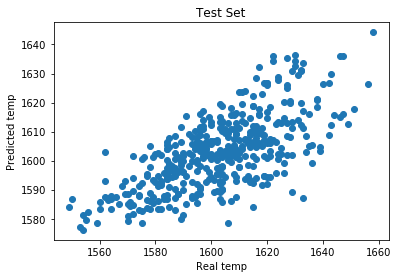

In [138]:
plt.scatter(y_temp_test, y_temp_test_pred)
plt.xlabel('Real temp')
plt.ylabel('Predicted temp') 
plt.title("Test Set")
plt.show()

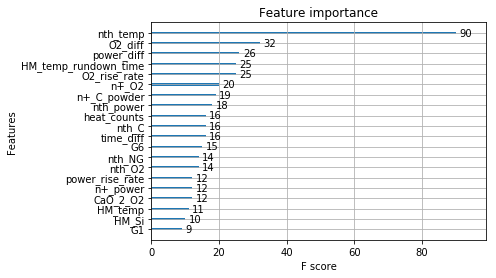

In [139]:
xgb.plot_importance(xgb_temp, max_num_features=20)

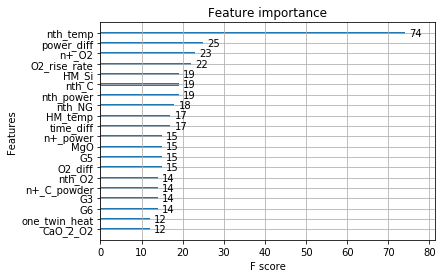

In [134]:
# xgb.plot_importance(xgb_temp, max_num_features=20)

# Combine & Export

In [140]:
y_C_test_pred = pd.Series(data=y_C_test_pred)
y_P_test_pred = pd.Series(data=y_P_test_pred)
y_temp_test_pred = pd.Series(data=y_temp_test_pred)

In [141]:
y_C_test = y_C_test.reset_index()
y_P_test = y_P_test.reset_index()
y_temp_test = y_temp_test.reset_index()
X_P_test = X_P_test.reset_index()

In [142]:
y_C_test.head()

,index,n+_C
0,3741,6.39
1,3742,26.76
2,3745,27.16
3,3746,8.29
4,3752,5.17


In [143]:
X_P_test.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,nth_P,n+_power,power_diff,power_rise_rate,n+_O2,O2_diff,O2_rise_rate,n+_power/O2,n+_NG,n+_C_powder
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,9,34000,2000,14.285714,6179,204,1.457143,5.502508,937,783
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,23,32800,1400,6.113537,4610,528,2.305677,7.114967,834,594
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,16,31300,1700,7.391304,5217,566,2.460870,5.999617,643,1004
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,18,31700,400,1.746725,5780,563,2.458515,5.484429,672,1183
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,19,35300,2500,15.822785,6046,320,2.025316,5.838571,736,1366


In [144]:
df_C_P_temp_test = X_P_test.join(y_C_test.drop(['index'],axis=1)).join(y_P_test.drop(['index'],axis=1)).join(y_temp_test.drop(['index'],axis=1))
df_C_P_temp_test.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,power_rise_rate,n+_O2,O2_diff,O2_rise_rate,n+_power/O2,n+_NG,n+_C_powder,n+_C,n+_P,n+_temp
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,14.285714,6179,204,1.457143,5.502508,937,783,6.39,7,1596
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,6.113537,4610,528,2.305677,7.114967,834,594,26.76,26,1603
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,7.391304,5217,566,2.460870,5.999617,643,1004,27.16,18,1554
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,1.746725,5780,563,2.458515,5.484429,672,1183,8.29,12,1590
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,15.822785,6046,320,2.025316,5.838571,736,1366,5.17,20,1603


In [145]:
df_C_P_temp_test_pred = pd.concat([df_C_P_temp_test, y_C_test_pred, y_P_test_pred, y_temp_test_pred], axis=1)
df_C_P_temp_test_pred.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,O2_rise_rate,n+_power/O2,n+_NG,n+_C_powder,n+_C,n+_P,n+_temp,0,1,2
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,1.457143,5.502508,937,783,6.39,7,1596,6.718757,10.139346,1608.866699
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,2.305677,7.114967,834,594,26.76,26,1603,23.946907,21.746323,1589.230103
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,2.460870,5.999617,643,1004,27.16,18,1554,22.003548,15.630270,1576.138184
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,2.458515,5.484429,672,1183,8.29,12,1590,11.386122,16.640308,1581.095215
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,2.025316,5.838571,736,1366,5.17,20,1603,5.816281,17.886827,1597.202148


In [146]:
df_C_P_temp_test_pred.rename(columns={0: 'n+_C_pred', 1:'n+_P_pred', 2:'n+_temp_pred'}, inplace=True)
df_C_P_temp_test_pred.head()

,index,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,P_GK,G1,...,O2_rise_rate,n+_power/O2,n+_NG,n+_C_powder,n+_C,n+_P,n+_temp,n+_C_pred,n+_P_pred,n+_temp_pred
0,3741,1498,312,123,979,0,2,14.0,25,69500.0,...,1.457143,5.502508,937,783,6.39,7,1596,6.718757,10.139346,1608.866699
1,3742,1521,477,95,140,1,2,14.0,25,69500.0,...,2.305677,7.114967,834,594,26.76,26,1603,23.946907,21.746323,1589.230103
2,3745,1491,347,123,981,0,2,14.0,25,71100.0,...,2.460870,5.999617,643,1004,27.16,18,1554,22.003548,15.630270,1576.138184
3,3746,1491,347,123,981,0,2,14.0,25,71100.0,...,2.458515,5.484429,672,1183,8.29,12,1590,11.386122,16.640308,1581.095215
4,3752,1480,326,132,144,1,2,21.0,25,75000.0,...,2.025316,5.838571,736,1366,5.17,20,1603,5.816281,17.886827,1597.202148


In [147]:
df_C_P_temp_test_pred['C_variance'] = df_C_P_temp_test_pred['n+_C_pred'] - df_C_P_temp_test_pred['n+_C']
df_C_P_temp_test_pred['P_variance'] = df_C_P_temp_test_pred['n+_P_pred'] - df_C_P_temp_test_pred['n+_P']
df_C_P_temp_test_pred['temp_variance'] = df_C_P_temp_test_pred['n+_temp_pred'] - df_C_P_temp_test_pred['n+_temp']

/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


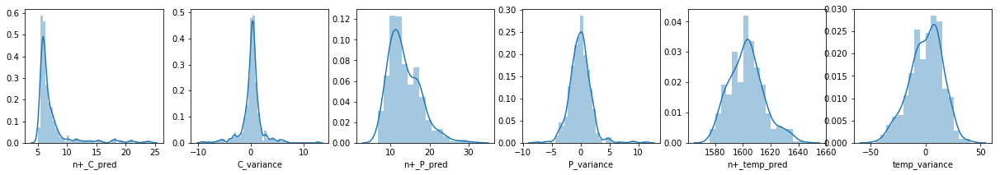

In [148]:
plt.figure(figsize=(21, 3))
plt.subplot(1,6,1)
sns.distplot(df_C_P_temp_test_pred['n+_C_pred'])
plt.subplot(1,6,2)
sns.distplot(df_C_P_temp_test_pred['C_variance'])
plt.subplot(1,6,3)
sns.distplot(df_C_P_temp_test_pred['n+_P_pred'])
plt.subplot(1,6,4)
sns.distplot(df_C_P_temp_test_pred['P_variance'])
plt.subplot(1,6,5)
sns.distplot(df_C_P_temp_test_pred['n+_temp_pred'])
plt.subplot(1,6,6)
sns.distplot(df_C_P_temp_test_pred['temp_variance'])

In [149]:
df_C_P_temp_info = df_C_P_temp[info_list]

In [150]:
df_C_P_temp_info = df_C_P_temp_info.reset_index()
df_C_P_temp_info.head()

,index,month,heatno
0,1,110-08月,XL559
1,8,110-08月,VL570
2,11,110-08月,VL575
3,15,110-08月,VL579
4,16,110-08月,VL580


In [151]:
df_C_P_temp_output = pd.merge(df_C_P_temp_info, df_C_P_temp_test_pred, how='right', on='index')
df_C_P_temp_output.head()

,index,month,heatno,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,...,n+_C_powder,n+_C,n+_P,n+_temp,n+_C_pred,n+_P_pred,n+_temp_pred,C_variance,P_variance,temp_variance
0,3741,111-05,VQ824,1498,312,123,979,0,2,14.0,...,783,6.39,7,1596,6.718757,10.139346,1608.866699,0.328757,3.139346,12.866699
1,3742,111-05,XQ825,1521,477,95,140,1,2,14.0,...,594,26.76,26,1603,23.946907,21.746323,1589.230103,-2.813093,-4.253677,-13.769897
2,3745,111-05,VQ828,1491,347,123,981,0,2,14.0,...,1004,27.16,18,1554,22.003548,15.630270,1576.138184,-5.156452,-2.369730,22.138184
3,3746,111-05,VQ828,1491,347,123,981,0,2,14.0,...,1183,8.29,12,1590,11.386122,16.640308,1581.095215,3.096122,4.640308,-8.904785
4,3752,111-05,XQ832,1480,326,132,144,1,2,21.0,...,1366,5.17,20,1603,5.816281,17.886827,1597.202148,0.646281,-2.113173,-5.797852


In [152]:
df_C_P_temp_output.columns

Index(['index', 'month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time',
       'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK', 'P_GK', 'G1', 'G2',
       'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke',
       'CaO_2_O2', 'case1', 'case2', 'case3', 'case4', 'case5', 'case6',
       'case7', 'case8', 'time_diff', 'nth_temp', 'nth_power', 'nth_O2',
       'nth_power/O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'nth_P', 'n+_power',
       'power_diff', 'power_rise_rate', 'n+_O2', 'O2_diff', 'O2_rise_rate',
       'n+_power/O2', 'n+_NG', 'n+_C_powder', 'n+_C', 'n+_P', 'n+_temp',
       'n+_C_pred', 'n+_P_pred', 'n+_temp_pred', 'C_variance', 'P_variance',
       'temp_variance'],
      dtype='object')

In [153]:
df_C_P_temp_output = df_C_P_temp_output[['index', 'month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time', 
                                         'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK','P_GK',
                                         'G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke', 'CaO_2_O2',
                                         'case1', 'case2', 'case3', 'case4', 'case5', 'case6', 'case7', 'case8', 
                                         'time_diff', 'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG', 'nth_C_powder', 'nth_C', 'nth_P', 
                                         'n+_power', 'power_diff', 'power_rise_rate', 'n+_O2', 'O2_diff', 'O2_rise_rate', 'n+_power/O2', 'n+_NG', 'n+_C_powder', 
                                         'n+_C', 'n+_C_pred', 'C_variance', 'n+_P', 'n+_P_pred',
                                         'P_variance', 'n+_temp', 'n+_temp_pred', 'temp_variance']]

In [142]:
# df_C_P_temp_output.to_excel('1110620_C_P_temp_pred.xlsx', index=False)

In [154]:
df_O2_power_output.columns

Index(['index', 'month', 'heatno', 'HM_temp', 'HM_Si', 'HM_temp_rundown_time',
       'heat_counts', 'AB_heat', 'one_twin_heat', 'C_GK', 'P_GK', 'G1', 'G2',
       'G3', 'G4', 'G5', 'G6', 'scrap', 'MgO', 'CaF2', 'CaO', 'coke',
       'CaO_2_O2', 'nth_temp', 'nth_power', 'nth_O2', 'nth_power/O2', 'nth_NG',
       'nth_C_powder', 'nth_C', 'n+_temp', 'n+_C', 'n+_O2', 'n+_O2_pred',
       'n+_O2_variance', 'n+_O2_1615_6_pred', 'n+_power', 'n+_power_pred',
       'n+_power_variance', 'n+_power_1615_6_pred'],
      dtype='object')

In [155]:
df_pred_output_right = df_O2_power_output[['index', 'n+_O2', 'n+_O2_pred', 'n+_O2_variance', 'n+_O2_1615_6_pred', 
                                         'n+_power', 'n+_power_pred', 'n+_power_variance', 'n+_power_1615_6_pred']]

In [156]:
df_pred_output_right.head()

,index,n+_O2,n+_O2_pred,n+_O2_variance,n+_O2_1615_6_pred,n+_power,n+_power_pred,n+_power_variance,n+_power_1615_6_pred
0,3741,6179,6367.398438,188.398438,6368.781738,34000,34355.000000,355.000000,34399.996094
1,3742,4610,4849.940918,239.940918,5351.316406,32800,34079.765625,1279.765625,34097.687500
2,3745,5217,5283.868652,66.868652,5821.664551,31300,32742.884766,1442.884766,34009.792969
3,3746,5780,5844.558594,64.558594,6010.825195,31700,34062.238281,2362.238281,34596.621094
4,3752,6046,6109.787109,63.787109,6107.601074,35300,35912.667969,612.667969,35912.472656


In [157]:
df_pred_output = pd.merge(df_C_P_temp_output, df_pred_output_right, how='left', on='index')
df_pred_output.head()

,index,month,heatno,HM_temp,HM_Si,HM_temp_rundown_time,heat_counts,AB_heat,one_twin_heat,C_GK,...,n+_temp_pred,temp_variance,n+_O2_y,n+_O2_pred,n+_O2_variance,n+_O2_1615_6_pred,n+_power_y,n+_power_pred,n+_power_variance,n+_power_1615_6_pred
0,3741,111-05,VQ824,1498,312,123,979,0,2,14.0,...,1608.866699,12.866699,6179,6367.398438,188.398438,6368.781738,34000,34355.000000,355.000000,34399.996094
1,3742,111-05,XQ825,1521,477,95,140,1,2,14.0,...,1589.230103,-13.769897,4610,4849.940918,239.940918,5351.316406,32800,34079.765625,1279.765625,34097.687500
2,3745,111-05,VQ828,1491,347,123,981,0,2,14.0,...,1576.138184,22.138184,5217,5283.868652,66.868652,5821.664551,31300,32742.884766,1442.884766,34009.792969
3,3746,111-05,VQ828,1491,347,123,981,0,2,14.0,...,1581.095215,-8.904785,5780,5844.558594,64.558594,6010.825195,31700,34062.238281,2362.238281,34596.621094
4,3752,111-05,XQ832,1480,326,132,144,1,2,21.0,...,1597.202148,-5.797852,6046,6109.787109,63.787109,6107.601074,35300,35912.667969,612.667969,35912.472656


In [158]:
df_pred_output.to_excel('1111006_EAF_O2_power_C_P_temp_pred.xlsx', index=False)

# SHAP模型解釋 (SHapley Additive exPlanations)

# [Back to Model1_Training](#Model1_Training)

# 1.Model1_Shap_analysis

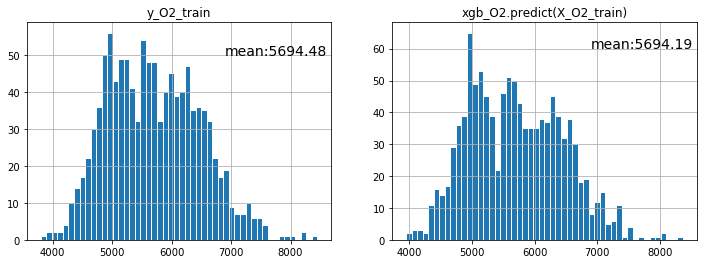

In [63]:
plt.figure(figsize=(12,4))
plt.subplot(121)
plt.title('y_O2_train')
y_O2_train.hist(bins=50,edgecolor='w')
plt.text(6900,50,'mean:%.2f' %y_O2_train.mean(),fontsize=14)

plt.subplot(122)
plt.title('xgb_O2.predict(X_O2_train)')
ppred = xgb_O2.predict(X_O2_train)
nnn,*ccc = plt.hist(ppred,bins=50,edgecolor='w')
plt.text(6900,60,'mean:%.2f' %ppred.mean(),fontsize=14)
plt.grid()

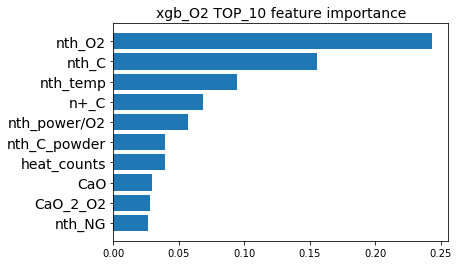

In [61]:
plt.figure()
plt.title('xgb_O2 TOP_10 feature importance',size=14)
index = np.argsort(xgb_O2.feature_importances_)[-10:]
plt.barh(X_O2_train.columns[index],xgb_O2.feature_importances_[index])
plt.yticks(fontsize=14)
plt.show()

In [64]:
explainer = shap.TreeExplainer(xgb_O2)
shap_values = explainer.shap_values(X_O2_train)
print('SHAP期望值:',explainer.expected_value)

SHAP期望值: 5694.192


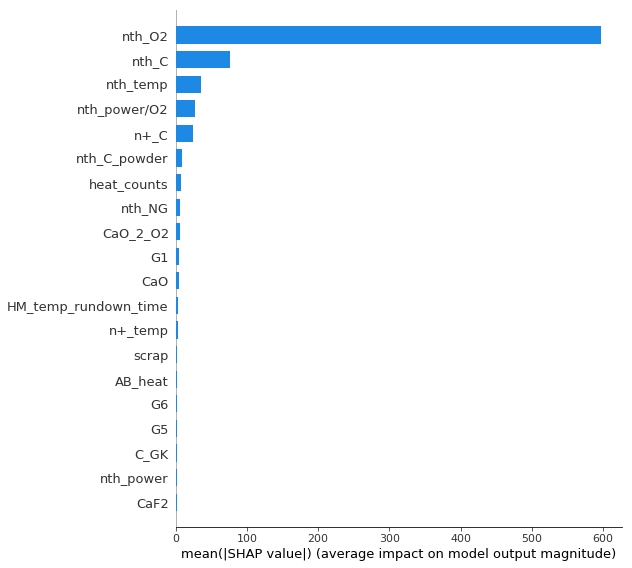

In [65]:
# Global Interpretation
shap.summary_plot(shap_values, X_O2_train, plot_type="bar")

In [66]:
num = 3
print("第 %d 爐總氧預測值" %num, xgb_O2.predict(X_O2_train.iloc[num:num+1,:]),'\n\n')
shap.force_plot(explainer.expected_value, shap_values[num,:], X_O2_train.iloc[num,:])

第 3 爐總氧預測值 [6802.677] 




In [68]:
num = 3
a = pd.DataFrame(X_O2_train.iloc[num,:].values,index=X_O2_train.columns,columns=['實際值'])
a['shap值'] = shap_values[num,:]
a['abs(shap值)'] = np.abs(a['shap值'])
a.sort_index(ascending=False,by=['abs(shap值)']).head(10) #僅列前十大Shap值特徵

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: by argument to sort_index is deprecated, please use .sort_values(by=...)
  """


,實際值,shap值,abs(shap值)
nth_O2,6576.000000,1209.545288,1209.545288
nth_C,6.490000,-56.730156,56.730156
nth_temp,1603.000000,-53.912312,53.912312
nth_power/O2,2.782847,42.990925,42.990925
heat_counts,661.000000,-11.590026,11.590026
n+_C,6.050000,10.407603,10.407603
nth_C_powder,663.000000,-8.945226,8.945226
CaF2,289.000000,-6.615500,6.615500
nth_NG,684.000000,-5.837818,5.837818
G6,39500.000000,-4.922120,4.922120


In [70]:
# num=3
explainer.expected_value + a['shap值'].sum()

6802.6787

In [69]:
num = 5
print("第 %d 爐總氧預測值" %num, xgb_O2.predict(X_O2_train.iloc[num:num+1,:]),'\n\n')
shap.force_plot(explainer.expected_value, shap_values[num,:], X_O2_train.iloc[num,:])

第 5 爐總氧預測值 [5295.837] 




In [71]:
num = 5
a = pd.DataFrame(X_O2_train.iloc[num,:].values,index=X_O2_train.columns,columns=['實際值'])
a['shap值'] = shap_values[num,:]
a['abs(shap值)'] = np.abs(a['shap值'])
a.sort_index(ascending=False,by=['abs(shap值)']).head(10) #僅列前十大Shap值特徵

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: by argument to sort_index is deprecated, please use .sort_values(by=...)
  """


,實際值,shap值,abs(shap值)
nth_O2,4886.000000,-388.300598,388.300598
nth_temp,1547.000000,64.775772,64.775772
nth_C,8.060000,-55.065445,55.065445
n+_C,6.080000,19.664524,19.664524
nth_power/O2,5.914859,-17.049007,17.049007
n+_temp,1559.000000,-9.285534,9.285534
nth_C_powder,602.000000,-6.618246,6.618246
G1,68000.000000,-5.494479,5.494479
CaO_2_O2,2154.000000,-3.279636,3.279636
AB_heat,0.000000,2.885545,2.885545


In [72]:
# num=5
explainer.expected_value + a['shap值'].sum()

5295.842

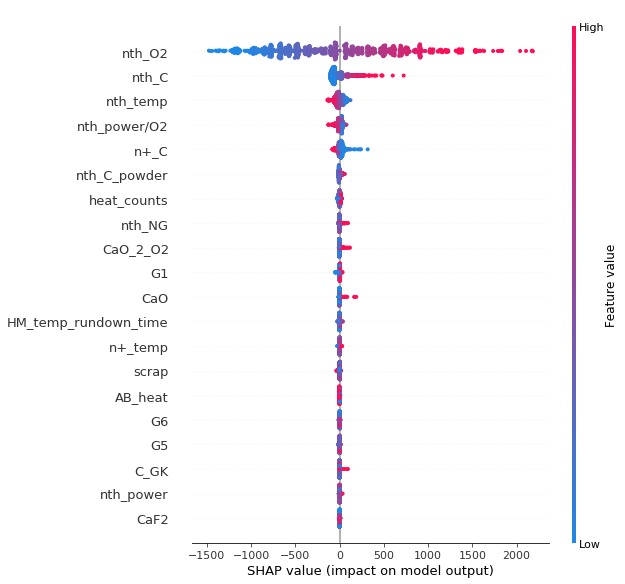

In [87]:
shap.summary_plot(shap_values, X_O2_train)

In [73]:
shap.force_plot(explainer.expected_value, shap_values, X_O2_train)

Could not find feature named: None


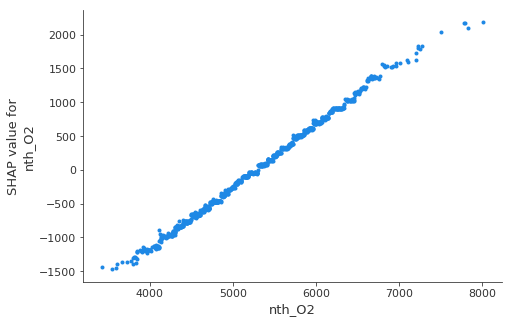

In [74]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('nth_O2', shap_values, X_O2_train, interaction_index='None')


Could not find feature named: None


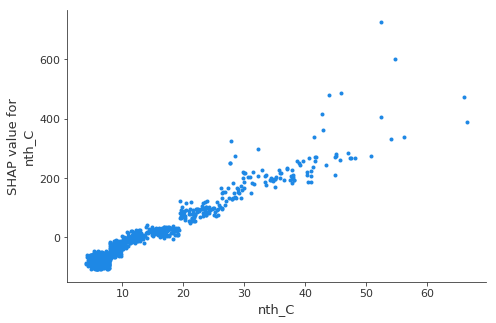

In [75]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('nth_C', shap_values, X_O2_train, interaction_index='None')

In [76]:
from sklearn.linear_model import LinearRegression
lr= LinearRegression()
lr.fit(X_O2_train['nth_O2'].values.reshape(-1,1),shap_values[:,22].reshape(-1,1))
print(lr.coef_)
print(lr.intercept_)

[[0.92375473]]
[-4870.67854381]


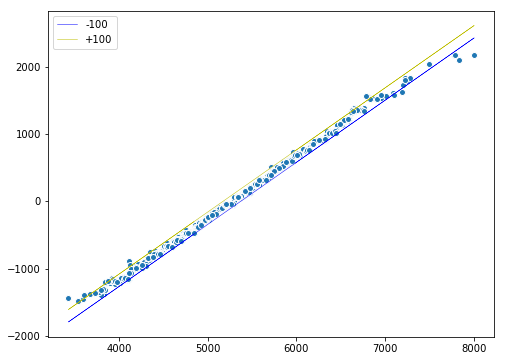

In [77]:
nn=100
predd = lr.intercept_[0] + lr.coef_[0][0]*(X_O2_train['nth_O2'].values.reshape(-1,1))
predd1 = lr.intercept_[0] + lr.coef_[0][0]*(X_O2_train['nth_O2'].values.reshape(-1,1)+nn)
predd2 = lr.intercept_[0] + lr.coef_[0][0]*(X_O2_train['nth_O2'].values.reshape(-1,1)-nn)

plt.figure(figsize=(8,6))
plt.scatter(X_O2_train['nth_O2'].values.reshape(-1,1),shap_values[:,22].reshape(-1,1),edgecolor='w')
plt.plot(X_O2_train['nth_O2'].values.reshape(-1,1),predd2,color='b',label='-100',linewidth='0.5')
plt.plot(X_O2_train['nth_O2'].values.reshape(-1,1),predd1,color='y',label='+100',linewidth='0.5')
plt.legend()

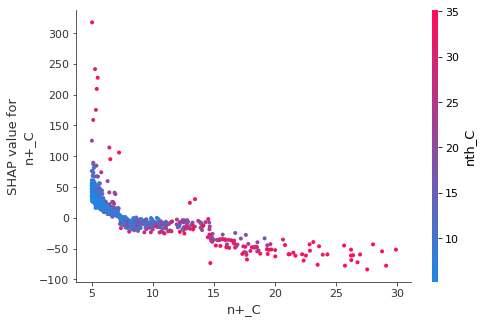

In [78]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_C', shap_values, X_O2_train, interaction_index='nth_C')

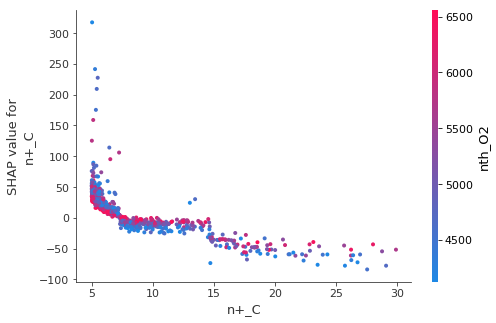

In [79]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_C', shap_values, X_O2_train, interaction_index='nth_O2')

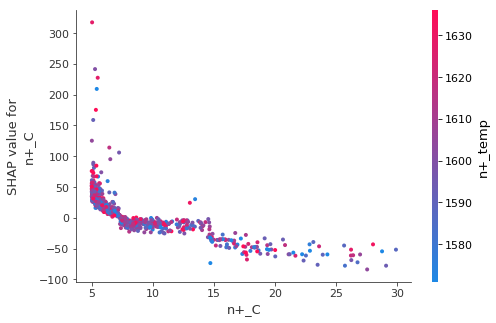

In [80]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_C', shap_values, X_O2_train, interaction_index='n+_temp')

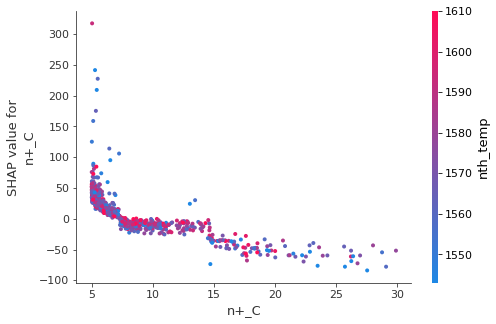

In [81]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_C', shap_values, X_O2_train, interaction_index='nth_temp')

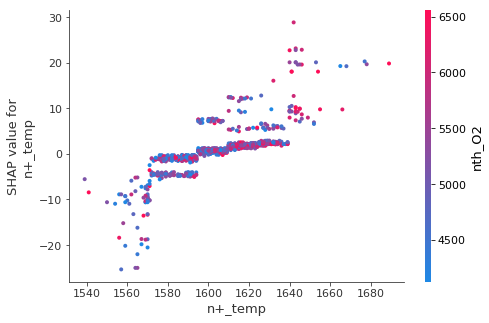

In [82]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_O2_train, interaction_index='nth_O2')

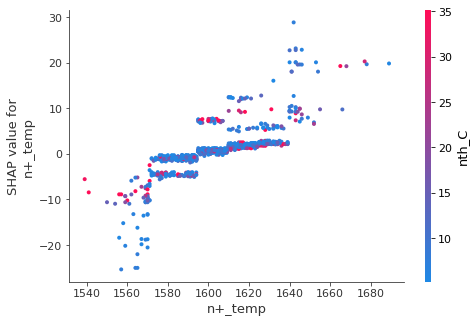

In [83]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_O2_train, interaction_index='nth_C')

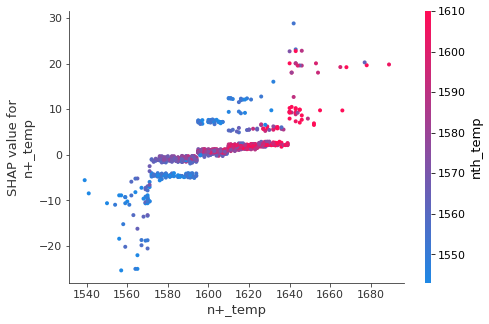

In [84]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_O2_train, interaction_index='nth_temp')

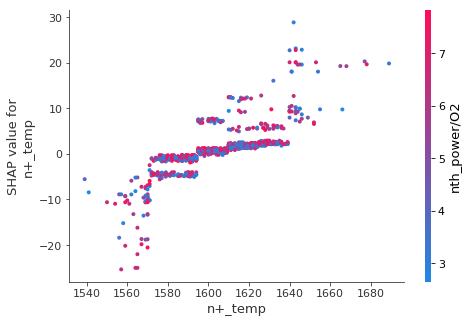

In [85]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_O2_train, interaction_index='nth_power/O2')

Could not find feature named: nth_P


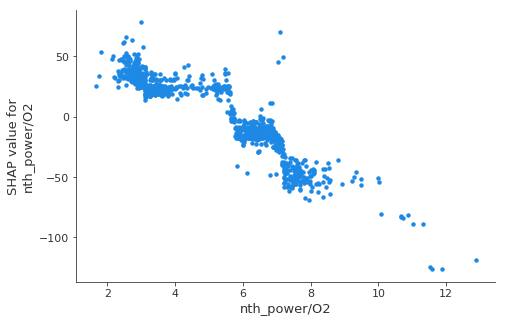

In [86]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('nth_power/O2', shap_values, X_O2_train, interaction_index='nth_P',dot_size=20)

# [Back to Model2_Training](#Model2_Training)

# 2.Model2_Shap_analysis

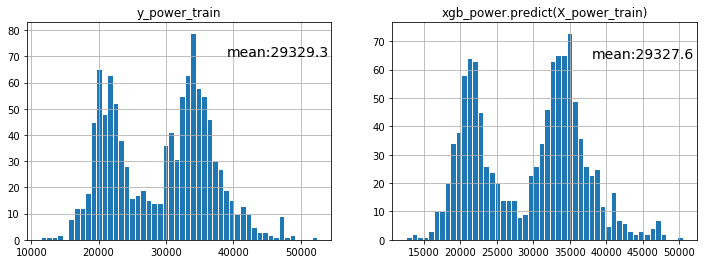

In [98]:
plt.figure(figsize=(12,4))
plt.subplot(121)
plt.title('y_power_train')
y_power_train.hist(bins=50,edgecolor='w')
plt.text(39000,70,'mean:%.1f' %y_power_train.mean(),fontsize=14)

plt.subplot(122)
plt.title('xgb_power.predict(X_power_train)')
ppred = xgb_power.predict(X_power_train)
nnn,*ccc = plt.hist(ppred,bins=50,edgecolor='w')
plt.text(38000,64,'mean:%.1f' %ppred.mean(),fontsize=14)
plt.grid()

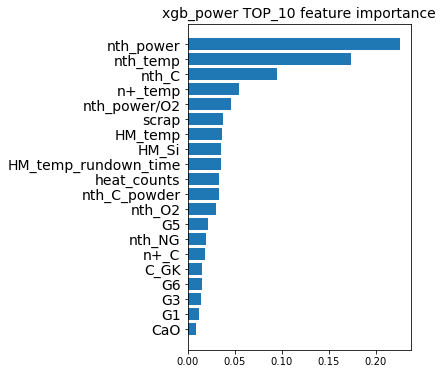

In [97]:
plt.figure(figsize=(4,6))
plt.title('xgb_power TOP_10 feature importance',size=14)
index = np.argsort(xgb_power.feature_importances_)[-20:]
plt.barh(X_power_train.columns[index],xgb_power.feature_importances_[index])
plt.yticks(fontsize=14)
plt.show()

In [99]:
explainer = shap.TreeExplainer(xgb_power)
shap_values = explainer.shap_values(X_power_train)
print('SHAP期望值:',explainer.expected_value)

SHAP期望值: 29327.64


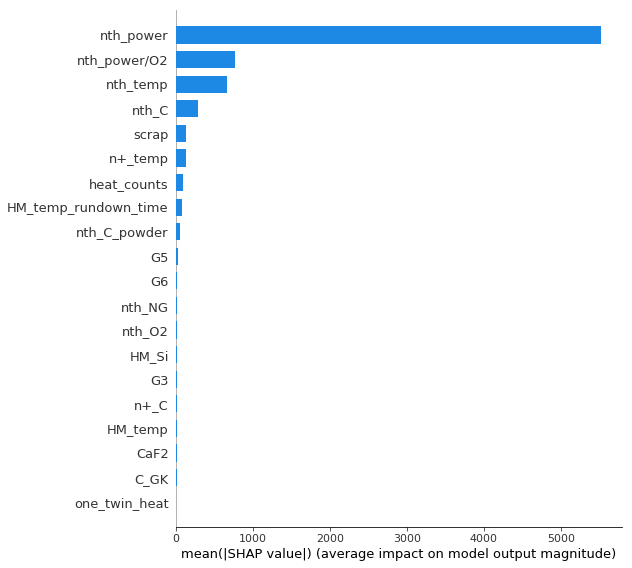

In [100]:
# Global Interpretation
shap.summary_plot(shap_values, X_power_train, plot_type="bar")

In [101]:
num = 3
print("第 %d 爐總氧預測值" %num, xgb_power.predict(X_power_train.iloc[num:num+1,:]),'\n\n')
shap.force_plot(explainer.expected_value, shap_values[num,:], X_O2_train.iloc[num,:])

第 3 爐總氧預測值 [20349.807] 




In [110]:
num = 3
a = pd.DataFrame(X_power_train.iloc[num,:].values,index=X_power_train.columns,columns=['實際值'])
a['shap值'] = shap_values[num,:]
a['abs(shap值)'] = np.abs(a['shap值'])
a.sort_index(ascending=False,by=['abs(shap值)']).head(10) #僅列前十大Shap值特徵

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: by argument to sort_index is deprecated, please use .sort_values(by=...)
  """


,實際值,shap值,abs(shap值)
nth_power,18300.000000,-6743.654297,6743.654297
nth_power/O2,2.782847,-1089.455444,1089.455444
nth_temp,1603.000000,-1038.880127,1038.880127
nth_C,6.490000,191.783585,191.783585
scrap,65.300000,-145.369461,145.369461
G5,13400.000000,-142.010406,142.010406
n+_temp,1632.000000,130.421005,130.421005
HM_temp_rundown_time,45.000000,-101.145607,101.145607
heat_counts,661.000000,70.784760,70.784760
HM_Si,427.000000,-50.852379,50.852379


In [109]:
explainer.expected_value + a['shap值'].sum()

20349.805

In [104]:
num = 5
print("第 %d 爐總氧預測值" %num, xgb_power.predict(X_power_train.iloc[num:num+1,:]),'\n\n')
shap.force_plot(explainer.expected_value, shap_values[num,:], X_O2_train.iloc[num,:])

第 5 爐總氧預測值 [33153.406] 




In [105]:
num = 5
a = pd.DataFrame(X_power_train.iloc[num,:].values,index=X_power_train.columns,columns=['實際值'])
a['shap值'] = shap_values[num,:]
a['abs(shap值)'] = np.abs(a['shap值'])
a.sort_index(ascending=False,by=['abs(shap值)']).head(10) #僅列前十大Shap值特徵

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: by argument to sort_index is deprecated, please use .sort_values(by=...)
  """


,實際值,shap值,abs(shap值)
nth_power,28900.000000,2497.459473,2497.459473
nth_temp,1547.000000,1111.111328,1111.111328
n+_temp,1559.000000,-354.424408,354.424408
nth_power/O2,5.914859,289.391205,289.391205
scrap,84.900000,185.537949,185.537949
nth_C,8.060000,104.126060,104.126060
nth_C_powder,602.000000,-51.979515,51.979515
G6,60100.000000,32.062790,32.062790
G3,12500.000000,21.579418,21.579418
heat_counts,421.000000,-20.029131,20.029131


In [106]:
explainer.expected_value + a['shap值'].sum()

33153.4

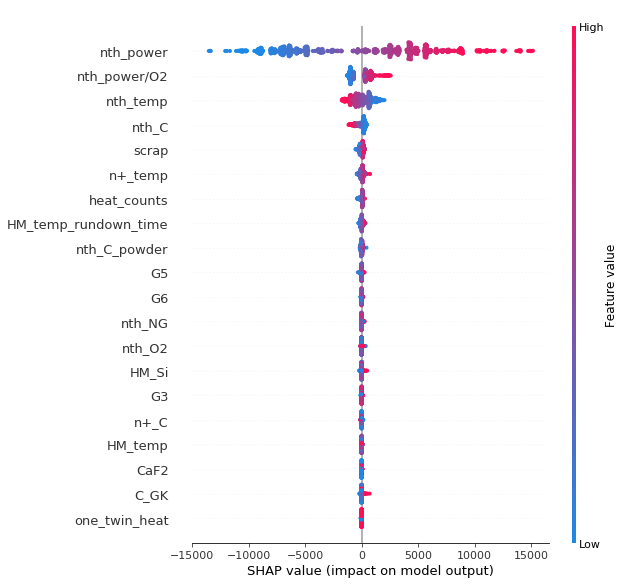

In [127]:
shap.summary_plot(shap_values, X_power_train)

In [107]:
shap.force_plot(explainer.expected_value, shap_values, X_power_train)

Could not find feature named: None


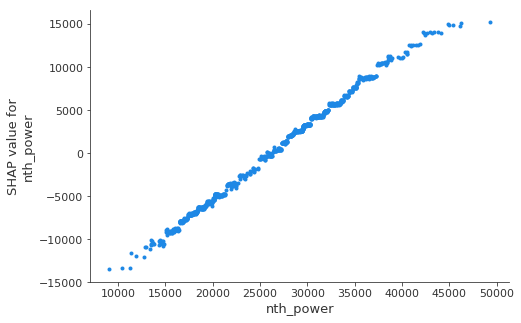

In [111]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('nth_power', shap_values, X_power_train, interaction_index='None')

In [114]:
from sklearn.linear_model import LinearRegression
lr= LinearRegression()
lr.fit(X_power_train['nth_power'].values.reshape(-1,1),shap_values[:,21].reshape(-1,1))
print(lr.coef_)
print(lr.intercept_)

[[0.85074106]]
[-22305.47914747]


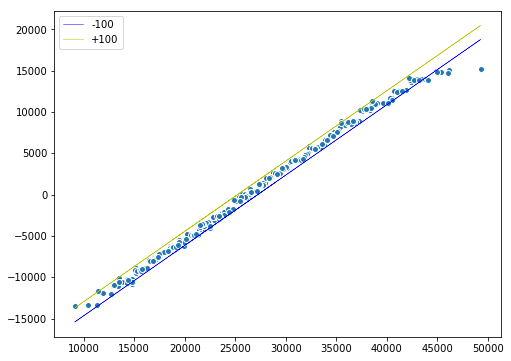

In [116]:
nn=1000
predd = lr.intercept_[0] + lr.coef_[0][0]*(X_power_train['nth_power'].values.reshape(-1,1))
predd1 = lr.intercept_[0] + lr.coef_[0][0]*(X_power_train['nth_power'].values.reshape(-1,1)+nn)
predd2 = lr.intercept_[0] + lr.coef_[0][0]*(X_power_train['nth_power'].values.reshape(-1,1)-nn)

plt.figure(figsize=(8,6))
plt.scatter(X_power_train['nth_power'].values.reshape(-1,1),shap_values[:,21].reshape(-1,1),edgecolor='w')
plt.plot(X_power_train['nth_power'].values.reshape(-1,1),predd2,color='b',label='-100',linewidth='0.5')
plt.plot(X_power_train['nth_power'].values.reshape(-1,1),predd1,color='y',label='+100',linewidth='0.5')
plt.legend()

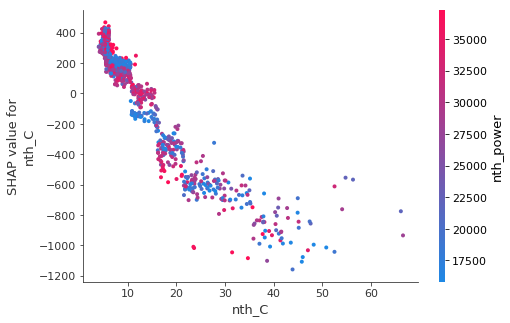

In [119]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('nth_C', shap_values, X_power_train, interaction_index='nth_power')

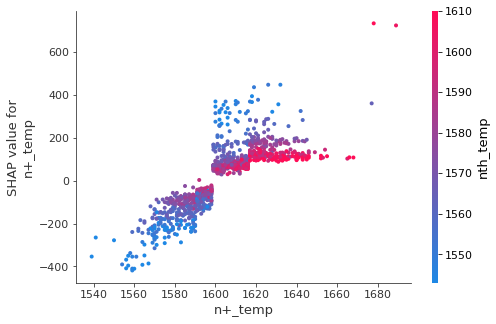

In [118]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_power_train, interaction_index='nth_temp')

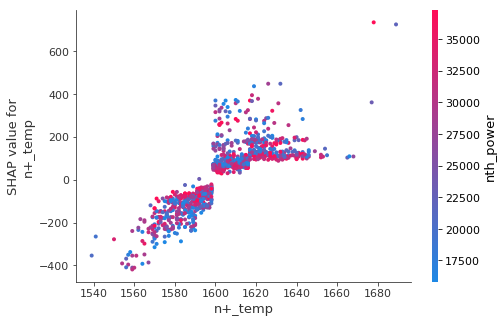

In [120]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_power_train, interaction_index='nth_power')

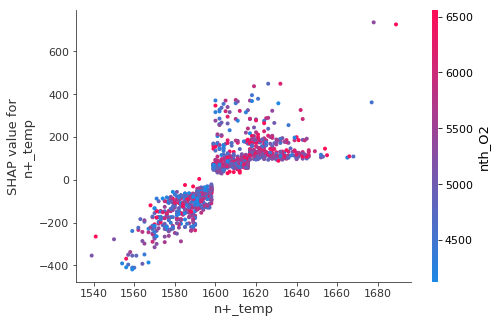

In [125]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_power_train, interaction_index='nth_O2')

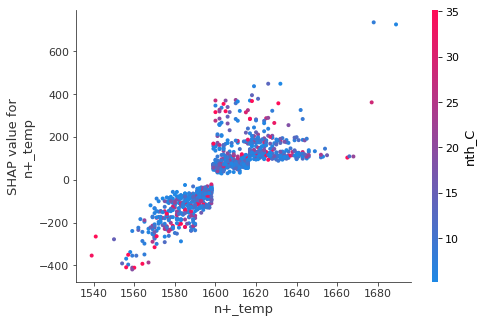

In [126]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_temp', shap_values, X_power_train, interaction_index='nth_C')

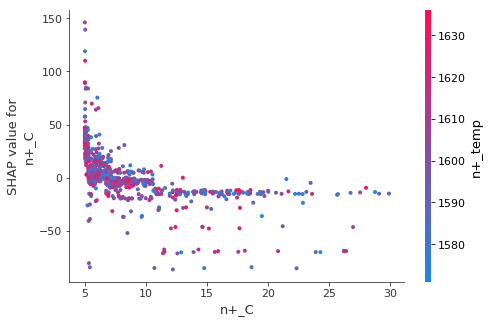

In [123]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_C', shap_values, X_power_train, interaction_index='n+_temp')

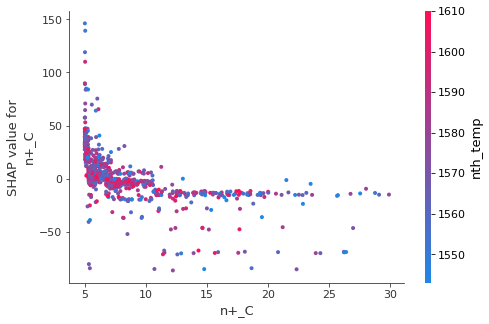

In [124]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('n+_C', shap_values, X_power_train, interaction_index='nth_temp')